In [1]:
# Import the Required Packages
import tensorflow as tf
from tensorflow import keras
import os
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
import matplotlib.pyplot as plt
import numpy as np

2024-12-13 23:15:31.230956: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734102931.313145  112424 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734102931.336593  112424 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-13 23:15:31.415192: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
print(tf.config.list_physical_devices()) 
 
# Check if GPU is available 
gpus = tf.config.list_physical_devices('GPU') 
if gpus: 
    print(f"GPUs available: {gpus}") 
else: 
    print("No GPUs available.")

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Step 1: Data Loading

In [3]:
base_dir = os.getcwd()

train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')
validation_dir = os.path.join(base_dir, 'validation')

## Step 2:  Develop the Image Classification Models

### Model #1 (Test Model 1)

In [4]:
# Base Model (No changes)

In [20]:
# All images will be rescaled by 1./255
img_size = 150

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(img_size, img_size),
        batch_size=20,
        # Since we use categorical_crossentropy loss, we need categorical labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [6]:
for data_batch, labels_batch in train_generator:
    print('Data Batch Shape:', data_batch.shape)
    print('Labels Batch Shape:', labels_batch.shape)
    break

Data Batch Shape: (20, 150, 150, 3)
Labels Batch Shape: (20, 10)


In [7]:
model1_0 = models.Sequential()
model1_0.add(keras.Input(shape=(img_size, img_size, 3)))
model1_0.add(layers.Conv2D(32, (3, 3), activation='relu'))
model1_0.add(layers.MaxPooling2D((2, 2)))

model1_0.add(layers.Conv2D(64, (3, 3), activation='relu'))
model1_0.add(layers.MaxPooling2D((2, 2)))

model1_0.add(layers.Conv2D(128, (3, 3), activation='relu'))
model1_0.add(layers.MaxPooling2D((2, 2)))

model1_0.add(layers.Conv2D(128, (3, 3), activation='relu'))
model1_0.add(layers.MaxPooling2D((2, 2)))

model1_0.add(layers.Flatten())
model1_0.add(layers.Dense(512, activation='relu'))
model1_0.add(layers.Dense(10, activation='softmax'))

model1_0.summary()

I0000 00:00:1734002959.631762     906 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7537 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:0a:00.0, compute capability: 8.6


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,457,738 (13.19 MB)

 Trainable params: 3,457,738 (13.19 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
model1_0.compile(loss='categorical_crossentropy',
               optimizer=optimizers.RMSprop(learning_rate=1e-4),
               metrics=['acc'])

history = model1_0.fit(train_generator,
                      epochs=10,
                      validation_data=validation_generator)

Epoch 1/10


/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734002962.852954    1722 service.cc:148] XLA service 0x7fbf7c00a670 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734002962.853162    1722 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2024-12-12 19:29:22.894462: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1734002963.001213    1722 cuda_dnn.cc:529] Loaded cuDNN version 90300


  8/375 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - acc: 0.0753 - loss: 2.3128

I0000 00:00:1734002965.702553    1722 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


375/375 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - acc: 0.1920 - loss: 2.1541 - val_acc: 0.3330 - val_loss: 1.9206
Epoch 2/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - acc: 0.3513 - loss: 1.8540 - val_acc: 0.3270 - val_loss: 1.8698
Epoch 3/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - acc: 0.4182 - loss: 1.6955 - val_acc: 0.4310 - val_loss: 1.6830
Epoch 4/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.4647 - loss: 1.5862 - val_acc: 0.4265 - val_loss: 1.6676
Epoch 5/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - acc: 0.4844 - loss: 1.4962 - val_acc: 0.4710 - val_loss: 1.5582
Epoch 6/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.5239 - loss: 1.4063 - val_acc: 0.4590 - val_loss: 1.5742
Epoch 7/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - acc: 0.5501 - loss: 1.3287 - val_acc: 0.4830 - val_loss: 1.5512
Epoch 8/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - acc: 0.5899 - loss: 1.2377 - val_acc: 0.4890 - val_loss: 1.5191
Epoch 9/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/ste

Exception ignored in: <function AtomicFunction.__del__ at 0x7fc0afc38f40>
Traceback (most recent call last):
  File "/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/tensorflow/python/eager/polymorphic_function/atomic_function.py", line 286, in __del__
    def __del__(self):
  
KeyboardInterrupt: 


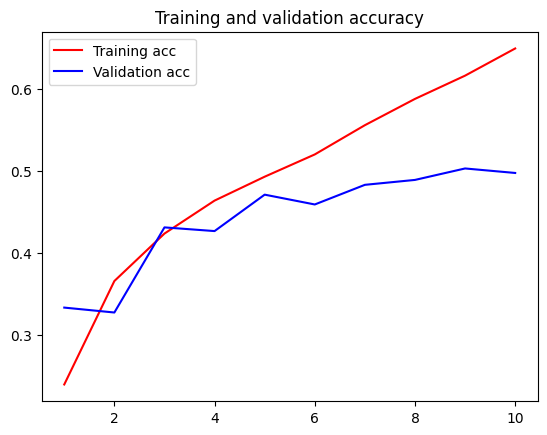

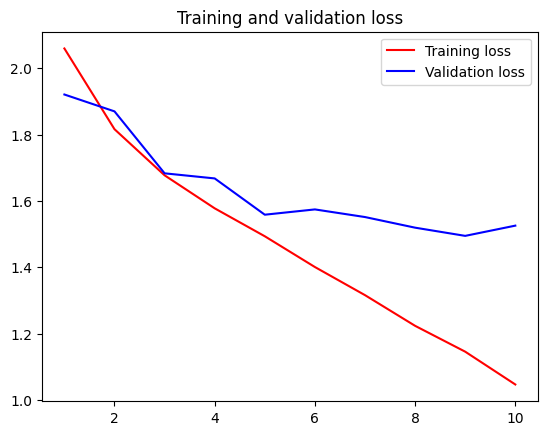

In [9]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [10]:
model1_0.save('food_model_1_0.h5')

### Model #1 (Test Model 2)

In [11]:
# Reduced the top 3 layers of the model by half:
# Convolutional Layer 1: 32 -> 16
# Convolutional Layer 2: 64 -> 32
# Convolutional Layer 3: 128 -> 64

In [12]:
model1_1 = models.Sequential()
model1_1.add(keras.Input(shape=(img_size, img_size, 3)))
model1_1.add(layers.Conv2D(16, (3, 3), activation='relu')) # reduced nodes from 32 -> 16
model1_1.add(layers.MaxPooling2D((2, 2)))

model1_1.add(layers.Conv2D(32, (3, 3), activation='relu')) # reduced nodes from 64 -> 32
model1_1.add(layers.MaxPooling2D((2, 2)))

model1_1.add(layers.Conv2D(64, (3, 3), activation='relu')) # reduced nodes from 128 -> 64
model1_1.add(layers.MaxPooling2D((2, 2)))

model1_1.add(layers.Conv2D(128, (3, 3), activation='relu'))
model1_1.add(layers.MaxPooling2D((2, 2)))

model1_1.add(layers.Flatten())
model1_1.add(layers.Dense(512, activation='relu'))
model1_1.add(layers.Dense(10, activation='softmax'))

model1_1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 148, 148, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 74, 74, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 72, 72, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 34, 34, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 15, 15, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,314,346 (12.64 MB)

 Trainable params: 3,314,346 (12.64 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
model1_1.compile(loss='categorical_crossentropy',
               optimizer=optimizers.RMSprop(learning_rate=1e-4),
               metrics=['acc'])

history = model1_1.fit(train_generator,
                      epochs=11,
                      validation_data=validation_generator)

Epoch 1/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - acc: 0.6696 - loss: 0.9940 - val_acc: 0.4955 - val_loss: 1.5696
Epoch 2/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - acc: 0.6965 - loss: 0.9062 - val_acc: 0.4750 - val_loss: 1.6708
Epoch 3/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.7296 - loss: 0.8010 - val_acc: 0.4790 - val_loss: 1.6286
Epoch 4/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.7603 - loss: 0.7181 - val_acc: 0.4745 - val_loss: 1.7224
Epoch 5/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - acc: 0.8172 - loss: 0.6004 - val_acc: 0.5000 - val_loss: 1.6564
Epoch 6/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.8381 - loss: 0.5231 - val_acc: 0.4950 - val_loss: 1.8136
Epoch 7/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.8730 - loss: 0.4194 - val_acc: 0.4875 - val_loss: 1.8038
Epoch 8/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.8908 - loss: 0.3549 - val_acc: 0.4715 - val_loss: 2.0090
Epoch 9/11
375/375 ━━━━━━━━━━━━━━━━━━━━ 

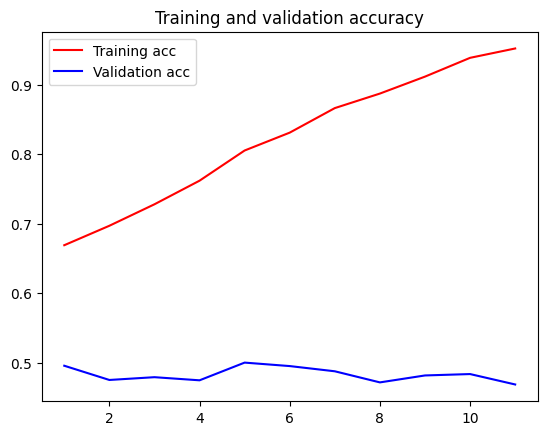

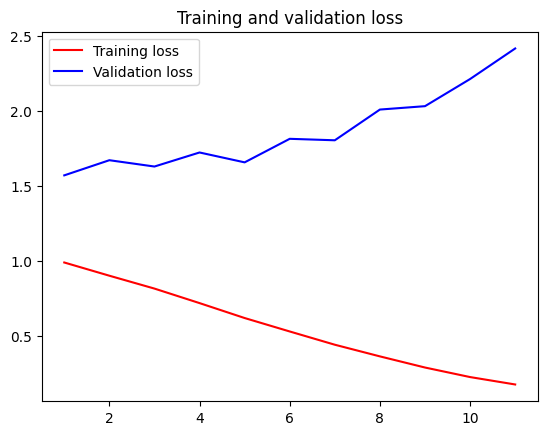

In [15]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [16]:
model1_1.save('food_model_1_1.h5')

### Model #1 (Test Model 3)

In [53]:
# As compared to previous model, changes made are:
# Addition of 1 convolutional layers

In [17]:
model1_2 = models.Sequential()
model1_2.add(keras.Input(shape=(img_size, img_size, 3)))
model1_2.add(layers.Conv2D(16, (3, 3), activation='relu')) # reduced nodes from 32 -> 16
model1_2.add(layers.MaxPooling2D((2, 2)))

model1_2.add(layers.Conv2D(32, (3, 3), activation='relu')) # reduced nodes from 64 -> 32
model1_2.add(layers.MaxPooling2D((2, 2)))

model1_2.add(layers.Conv2D(64, (3, 3), activation='relu')) # reduced nodes from 128 -> 64
model1_2.add(layers.MaxPooling2D((2, 2)))

model1_2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model1_2.add(layers.MaxPooling2D((2, 2)))

model1_2.add(layers.Conv2D(256, (3, 3), activation='relu')) # added this layer
model1_2.add(layers.MaxPooling2D((2, 2)))

model1_2.add(layers.Flatten())
model1_2.add(layers.Dense(512, activation='relu'))
model1_2.add(layers.Dense(10, activation='softmax'))

model1_2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 148, 148, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 74, 74, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 72, 72, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 34, 34, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 15, 15, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 922,538 (3.52 MB)

 Trainable params: 922,538 (3.52 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
model1_2.compile(loss='categorical_crossentropy',
               optimizer=optimizers.RMSprop(learning_rate=1e-4),
               metrics=['acc'])

history = model1_2.fit(train_generator,
                      epochs=22,
                      validation_data=validation_generator)

Epoch 1/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - acc: 0.1415 - loss: 2.2606 - val_acc: 0.2380 - val_loss: 2.0558
Epoch 2/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - acc: 0.2559 - loss: 2.0245 - val_acc: 0.2735 - val_loss: 2.0671
Epoch 3/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.3159 - loss: 1.9164 - val_acc: 0.3100 - val_loss: 1.9192
Epoch 4/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - acc: 0.3580 - loss: 1.8169 - val_acc: 0.3735 - val_loss: 1.7923
Epoch 5/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.4061 - loss: 1.7056 - val_acc: 0.3880 - val_loss: 1.7604
Epoch 6/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.4299 - loss: 1.6788 - val_acc: 0.4025 - val_loss: 1.7193
Epoch 7/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - acc: 0.4456 - loss: 1.6070 - val_acc: 0.4045 - val_loss: 1.7382
Epoch 8/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - acc: 0.4584 - loss: 1.5747 - val_acc: 0.4570 - val_loss: 1.6292
Epoch 9/22
375/375 ━━━━━━━━━━━━━━━━━━━━ 1

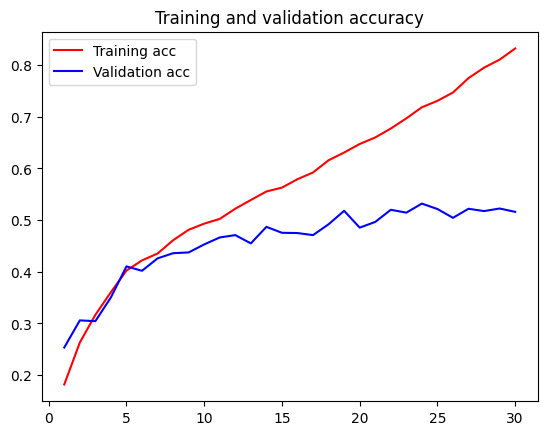

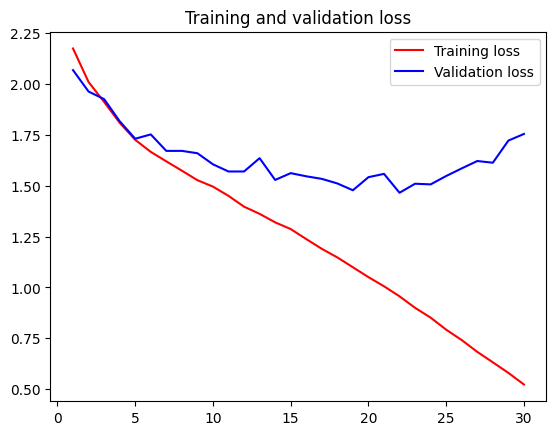

In [56]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [19]:
model1_2.save('food_model_1_2.h5')

### Model #1 (Test Model 4)

In [58]:
# As compared to previous model, changes made are:
# Addition of L2 regularizers on last Conv2D layer and dense layer

In [59]:
model1_3 = models.Sequential()
model1_3.add(keras.Input(shape=(img_size, img_size, 3)))
model1_3.add(layers.Conv2D(16, (3, 3), activation='relu')) # reduced nodes from 32 -> 16
model1_3.add(layers.MaxPooling2D((2, 2)))

model1_3.add(layers.Conv2D(32, (3, 3), activation='relu')) # reduced nodes from 64 -> 32
model1_3.add(layers.MaxPooling2D((2, 2)))

model1_3.add(layers.Conv2D(64, (3, 3), activation='relu')) # reduced nodes from 128 -> 64
model1_3.add(layers.MaxPooling2D((2, 2)))

model1_3.add(layers.Conv2D(128, (3, 3), activation='relu'))
model1_3.add(layers.MaxPooling2D((2, 2)))

model1_3.add(layers.Conv2D(128, (3, 3), activation='relu',  # added this layer
                           kernel_regularizer=regularizers.L2(0.01))) # added L2 regularization
model1_3.add(layers.MaxPooling2D((2, 2)))

model1_3.add(layers.Flatten())
model1_3.add(layers.Dense(512, activation='relu', kernel_regularizer=regularizers.L2(0.01))) # added L2 regularization
model1_3.add(layers.Dense(10, activation='softmax'))

model1_3.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_62 (Conv2D)              │ (None, 148, 148, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_61 (MaxPooling2D) │ (None, 74, 74, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_63 (Conv2D)              │ (None, 72, 72, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_62 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_64 (Conv2D)              │ (None, 34, 34, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_63 (MaxPooling2D) │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_65 (Conv2D)              │ (None, 15, 15, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_64 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_66 (Conv2D)              │ (None, 5, 5, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_65 (MaxPooling2D) │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 512,810 (1.96 MB)

 Trainable params: 512,810 (1.96 MB)

 Non-trainable params: 0 (0.00 B)

In [60]:
model1_3.compile(loss='categorical_crossentropy',
               optimizer=optimizers.RMSprop(learning_rate=1e-4),
               metrics=['acc'])

history = model1_3.fit(train_generator,
                      epochs=30,
                      validation_data=validation_generator)

Epoch 1/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - acc: 0.1450 - loss: 6.9374 - val_acc: 0.2415 - val_loss: 4.0172
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.2493 - loss: 3.6532 - val_acc: 0.3065 - val_loss: 3.0244
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.2949 - loss: 2.9377 - val_acc: 0.3085 - val_loss: 2.7263
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - acc: 0.3205 - loss: 2.6506 - val_acc: 0.3450 - val_loss: 2.5711
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.3474 - loss: 2.4783 - val_acc: 0.3630 - val_loss: 2.3783
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - acc: 0.3835 - loss: 2.2987 - val_acc: 0.3935 - val_loss: 2.2403
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.3981 - loss: 2.1725 - val_acc: 0.4040 - val_loss: 2.1460
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - acc: 0.4228 - loss: 2.0733 - val_acc: 0.4000 - val_loss: 2.1019
Epoch 9/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 

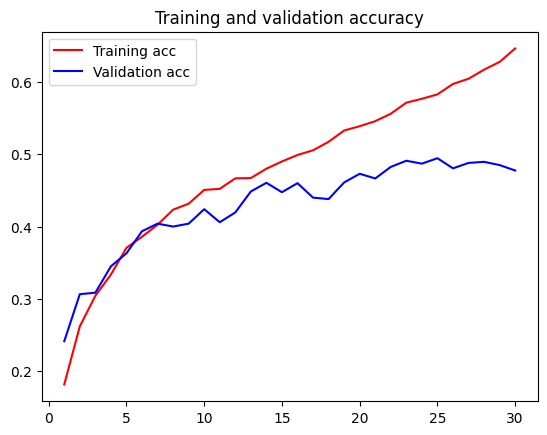

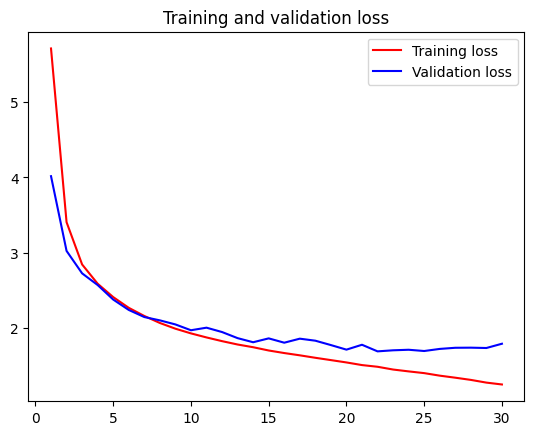

In [61]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [62]:
model1_3.save('food_model_1_3.h5')

### Model #1 (Test Model 5)

In [63]:
# As compared to previous model, changes made are:
# Changed optimiser RMSprop --> Adam

In [64]:
model1_4 = models.Sequential()
model1_4.add(keras.Input(shape=(img_size, img_size, 3)))
model1_4.add(layers.Conv2D(16, (3, 3), activation='relu')) # reduced nodes from 32 -> 16
model1_4.add(layers.MaxPooling2D((2, 2)))

model1_4.add(layers.Conv2D(32, (3, 3), activation='relu')) # reduced nodes from 64 -> 32
model1_4.add(layers.MaxPooling2D((2, 2)))

model1_4.add(layers.Conv2D(64, (3, 3), activation='relu')) # reduced nodes from 128 -> 64
model1_4.add(layers.MaxPooling2D((2, 2)))

model1_4.add(layers.Conv2D(128, (3, 3), activation='relu'))
model1_4.add(layers.MaxPooling2D((2, 2)))

model1_4.add(layers.Conv2D(128, (3, 3), activation='relu', # added this layer
                            kernel_regularizer=regularizers.L2(0.01))) # added L2 regularization
model1_4.add(layers.MaxPooling2D((2, 2)))

model1_4.add(layers.Flatten())
model1_4.add(layers.Dense(512, activation='relu', kernel_regularizer=regularizers.L2(0.01))) # added L2 regularization
model1_4.add(layers.Dense(10, activation='softmax'))

model1_4.summary()

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_67 (Conv2D)              │ (None, 148, 148, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_66 (MaxPooling2D) │ (None, 74, 74, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_68 (Conv2D)              │ (None, 72, 72, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_67 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_69 (Conv2D)              │ (None, 34, 34, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_68 (MaxPooling2D) │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 15, 15, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_69 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 5, 5, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_70 (MaxPooling2D) │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_13 (Flatten)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 512,810 (1.96 MB)

 Trainable params: 512,810 (1.96 MB)

 Non-trainable params: 0 (0.00 B)

In [65]:
model1_4.compile(loss='categorical_crossentropy',
               optimizer=optimizers.Adam(learning_rate=1e-4), # optimiser: RMSprop --> Adam
               metrics=['acc'])

history = model1_4.fit(train_generator,
                      epochs=30,
                      validation_data=validation_generator)

Epoch 1/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - acc: 0.1560 - loss: 6.8625 - val_acc: 0.2360 - val_loss: 3.7821
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - acc: 0.2290 - loss: 3.4578 - val_acc: 0.2750 - val_loss: 2.7479
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - acc: 0.2964 - loss: 2.6057 - val_acc: 0.3220 - val_loss: 2.4006
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - acc: 0.3522 - loss: 2.2861 - val_acc: 0.3345 - val_loss: 2.2231
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - acc: 0.3843 - loss: 2.1405 - val_acc: 0.3615 - val_loss: 2.1095
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.3938 - loss: 2.0259 - val_acc: 0.4015 - val_loss: 2.0252
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - acc: 0.4202 - loss: 1.9228 - val_acc: 0.4125 - val_loss: 1.9446
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.4278 - loss: 1.8787 - val_acc: 0.3975 - val_loss: 1.9221
Epoch 9/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s

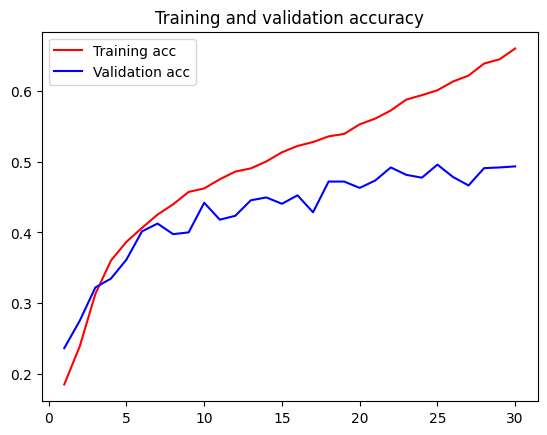

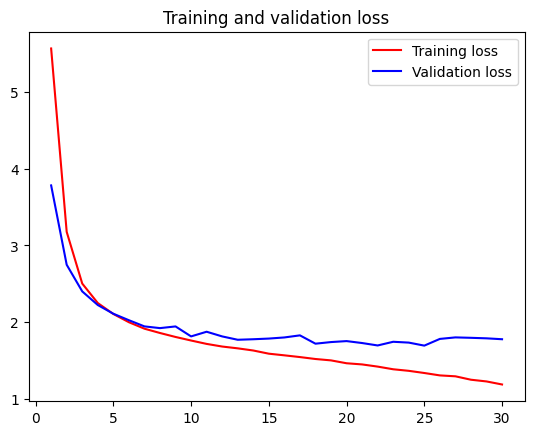

In [66]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [67]:
#model1_4.save('food_model_1_4.h5')

### Model #1 (Test Model 6)

In [68]:
# As compared to previous model, changes made are:
# Added Data Augmentation
# Removed Regularizer

In [69]:
model1_5 = models.Sequential()
model1_5.add(keras.Input(shape=(img_size, img_size, 3)))
model1_5.add(layers.Conv2D(16, (3, 3), activation='relu')) # reduced nodes from 32 -> 16
model1_5.add(layers.MaxPooling2D((2, 2)))

model1_5.add(layers.Conv2D(32, (3, 3), activation='relu')) # reduced nodes from 64 -> 32
model1_5.add(layers.MaxPooling2D((2, 2)))

model1_5.add(layers.Conv2D(64, (3, 3), activation='relu')) # reduced nodes from 128 -> 64
model1_5.add(layers.MaxPooling2D((2, 2)))

model1_5.add(layers.Conv2D(128, (3, 3), activation='relu'))
model1_5.add(layers.MaxPooling2D((2, 2)))

model1_5.add(layers.Conv2D(128, (3, 3), activation='relu'))# added this layer
model1_5.add(layers.MaxPooling2D((2, 2)))

model1_5.add(layers.Flatten())
model1_5.add(layers.Dense(512, activation='relu')) # added L2 regularization
model1_5.add(layers.Dense(10, activation='softmax'))

model1_5.summary()

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_72 (Conv2D)              │ (None, 148, 148, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_71 (MaxPooling2D) │ (None, 74, 74, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_73 (Conv2D)              │ (None, 72, 72, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_72 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_74 (Conv2D)              │ (None, 34, 34, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_73 (MaxPooling2D) │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_75 (Conv2D)              │ (None, 15, 15, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_74 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_76 (Conv2D)              │ (None, 5, 5, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_75 (MaxPooling2D) │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 512,810 (1.96 MB)

 Trainable params: 512,810 (1.96 MB)

 Non-trainable params: 0 (0.00 B)

In [70]:
# Train the Model
model1_5.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4), 
              metrics=['acc'])

# Added Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=20, 
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

history = model1_5.fit(
      train_generator,
      epochs=100,
      validation_data=validation_generator)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Epoch 1/100


/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


375/375 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - acc: 0.1409 - loss: 2.2463 - val_acc: 0.2360 - val_loss: 2.0626
Epoch 2/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - acc: 0.2463 - loss: 2.0588 - val_acc: 0.2345 - val_loss: 2.0850
Epoch 3/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - acc: 0.2988 - loss: 1.9392 - val_acc: 0.3075 - val_loss: 1.9820
Epoch 4/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - acc: 0.3461 - loss: 1.8811 - val_acc: 0.3370 - val_loss: 1.8736
Epoch 5/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - acc: 0.3652 - loss: 1.8231 - val_acc: 0.3790 - val_loss: 1.7542
Epoch 6/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - acc: 0.3832 - loss: 1.7786 - val_acc: 0.3785 - val_loss: 1.8077
Epoch 7/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - acc: 0.3895 - loss: 1.7662 - val_acc: 0.4210 - val_loss: 1.7199
Epoch 8/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - acc: 0.4234 - loss: 1.7068 - val_acc: 0.4265 - val_loss: 1.6650
Epoch 9/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 26s

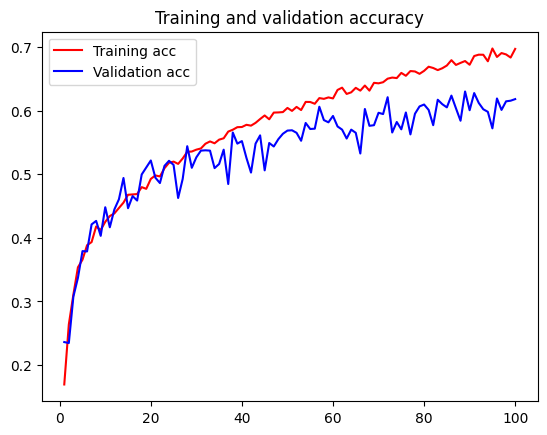

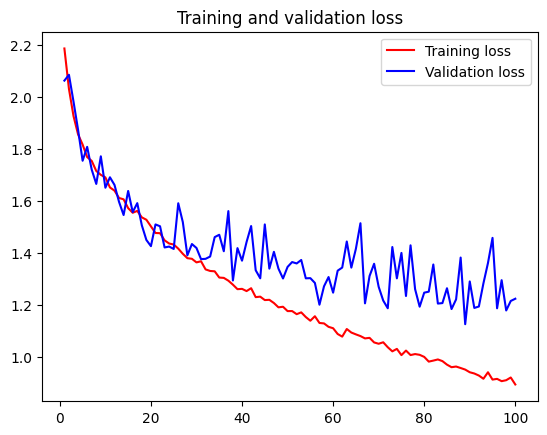

In [71]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [72]:
#model1_5.save('food_model_1_5.h5')

### Model #1 (Test Model 7)

In [73]:
# As compared to previous model, changes made are:
# Increased node count by twice for each layer

In [74]:
model1_6 = models.Sequential()
model1_6.add(keras.Input(shape=(img_size, img_size, 3)))
model1_6.add(layers.Conv2D(32, (3, 3), activation='relu')) # inreased nodes from 16 -> 32
model1_6.add(layers.MaxPooling2D((2, 2)))

model1_6.add(layers.Conv2D(64, (3, 3), activation='relu')) # inreased nodes from 32 -> 64
model1_6.add(layers.MaxPooling2D((2, 2)))

model1_6.add(layers.Conv2D(128, (3, 3), activation='relu')) # inreased nodes from 64 -> 128
model1_6.add(layers.MaxPooling2D((2, 2)))

model1_6.add(layers.Conv2D(256, (3, 3), activation='relu'))  # inreased nodes from 128 -> 256
model1_6.add(layers.MaxPooling2D((2, 2)))

model1_6.add(layers.Conv2D(512, (3, 3), activation='relu')) # added this layer  # inreased nodes from 128 -> 256
model1_6.add(layers.MaxPooling2D((2, 2)))

model1_6.add(layers.Flatten())
model1_6.add(layers.Dense(512, activation='relu')) # added L2 regularization
model1_6.add(layers.Dense(10, activation='softmax'))

model1_6.summary()

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_77 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_76 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_78 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_77 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_79 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_78 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_80 (Conv2D)              │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_79 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_81 (Conv2D)              │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_80 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_15 (Flatten)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,622,794 (10.01 MB)

 Trainable params: 2,622,794 (10.01 MB)

 Non-trainable params: 0 (0.00 B)

In [75]:
# Train the Model
model1_6.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4), 
              metrics=['acc'])

# Added Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=20, 
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

history = model1_6.fit(
      train_generator,
      epochs=50,
      validation_data=validation_generator)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Epoch 1/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - acc: 0.1568 - loss: 2.2153 - val_acc: 0.2705 - val_loss: 2.0185
Epoch 2/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - acc: 0.2804 - loss: 2.0066 - val_acc: 0.3215 - val_loss: 1.9133
Epoch 3/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - acc: 0.3270 - loss: 1.8972 - val_acc: 0.3610 - val_loss: 1.8363
Epoch 4/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - acc: 0.3835 - loss: 1.7961 - val_acc: 0.3900 - val_loss: 1.7965
Epoch 5/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - acc: 0.3940 - loss: 1.7500 - val_acc: 0.4335 - val_loss: 1.6672
Epoch 6/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - acc: 0.4054 - loss: 1.7037 - val_acc: 0.4390 - val_loss: 1.6320
Epoch 7/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - acc: 0.4231 - loss: 1.6680 - val_acc: 0.4625 - val_loss: 1.5846
Epoch 8/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - acc: 0.4297 - loss

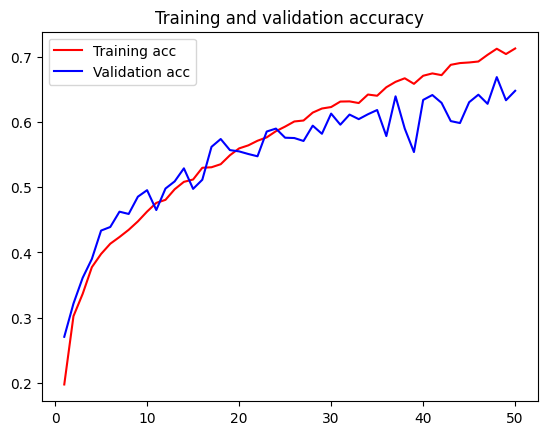

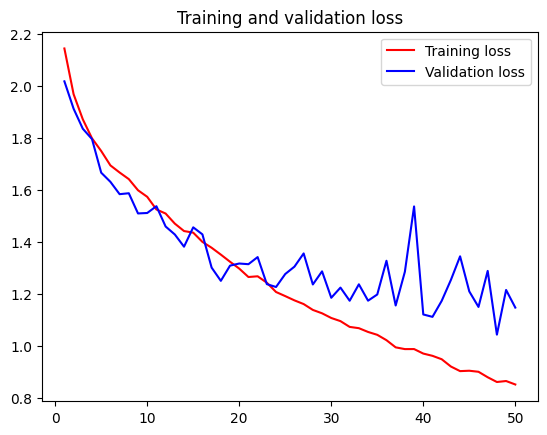

In [76]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [77]:
model1_6.save('food_model_1_6.h5')

### Model #1 (Test Model 8)

In [78]:
# As compared to previous model, changes made are:
# Added Dropout layer
# Decresed nodes
# Added L2 regularizer
# Optimiser: Adam

In [20]:
img_size = 150

model1_7 = models.Sequential()
model1_7.add(keras.Input(shape=(img_size, img_size, 3)))
model1_7.add(layers.Conv2D(8, (3, 3), activation='relu'))
model1_7.add(layers.MaxPooling2D((2, 2)))

model1_7.add(layers.Conv2D(16, (3, 3), activation='relu'))
model1_7.add(layers.MaxPooling2D((2, 2)))

model1_7.add(layers.Conv2D(32, (3, 3), activation='relu'))
model1_7.add(layers.MaxPooling2D((2, 2)))

model1_7.add(layers.Conv2D(64, (3, 3), activation='relu'))
model1_7.add(layers.MaxPooling2D((2, 2)))

model1_7.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_regularizer=regularizers.L2(0.005))) # added this layer
model1_7.add(layers.MaxPooling2D((2, 2)))

model1_7.add(layers.Flatten())
model1_7.add(layers.Dense(512, activation='relu'))
model1_7.add(layers.Dropout(0.01)) # Added Dropout Layer
model1_7.add(layers.Dense(10, activation='softmax'))

model1_7.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_13 (Conv2D)              │ (None, 148, 148, 8)    │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 74, 74, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 72, 72, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 36, 36, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 34, 34, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 17, 17, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 15, 15, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 5, 5, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 366,170 (1.40 MB)

 Trainable params: 366,170 (1.40 MB)

 Non-trainable params: 0 (0.00 B)

In [21]:
# Train the Model
model1_7.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4), 
              metrics=['acc'])

# Added Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=20, 
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

history = model1_7.fit(
      train_generator,
      epochs=150,
      validation_data=validation_generator)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Epoch 1/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - acc: 0.1295 - loss: 2.5814

/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


375/375 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - acc: 0.1296 - loss: 2.5810 - val_acc: 0.2330 - val_loss: 2.2327
Epoch 2/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - acc: 0.1994 - loss: 2.2340 - val_acc: 0.2540 - val_loss: 2.1393
Epoch 3/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - acc: 0.2461 - loss: 2.1438 - val_acc: 0.3010 - val_loss: 2.0571
Epoch 4/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - acc: 0.2891 - loss: 2.0600 - val_acc: 0.3370 - val_loss: 1.9769
Epoch 5/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - acc: 0.3170 - loss: 1.9961 - val_acc: 0.3460 - val_loss: 1.9357
Epoch 6/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - acc: 0.3354 - loss: 1.9421 - val_acc: 0.3465 - val_loss: 1.9255
Epoch 7/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.3495 - loss: 1.9193 - val_acc: 0.3795 - val_loss: 1.8603
Epoch 8/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.3497 - loss: 1.8932 - val_acc: 0.3780 - val_loss: 1.8531
Epoch 9/150
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s

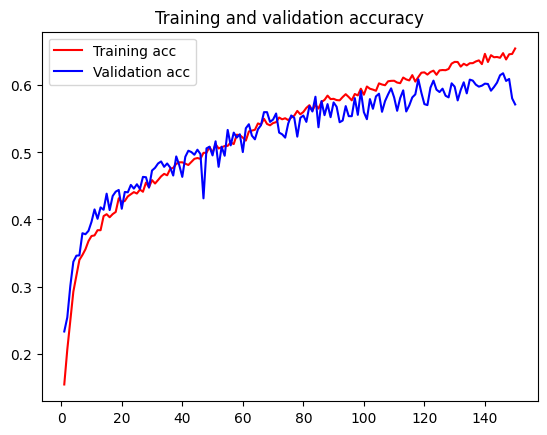

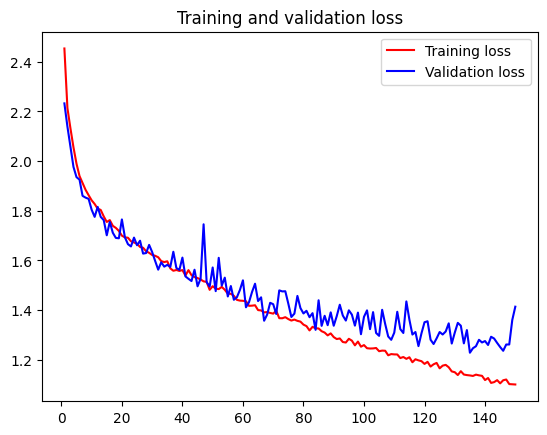

In [22]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [23]:
model1_7.save('food_model_1_7.h5')

In [ ]:
# Save the Model
#model1.save('food_model_1.h5')

### Model #2

In [1]:
import tensorflow as tf
from tensorflow import keras
import os
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
import matplotlib.pyplot as plt
import numpy as np

2024-12-15 00:27:14.033053: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734193634.119598  130260 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734193634.143995  130260 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-15 00:27:14.363446: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
base_dir = os.getcwd()

train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')
validation_dir = os.path.join(base_dir, 'validation')

In [24]:
# Build the Model
from tensorflow.keras.applications import VGG16
img_size = 150

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))

In [25]:
conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [26]:
img_size = 150

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


### Model 2 (Test Model 1)

In [40]:
# Base Model (No changes)

In [27]:
model2_0 = models.Sequential()

conv_base.trainable = False

for layer in conv_base.layers:
    model2_0.add(layer)
model2_0.add(layers.Flatten())
model2_0.add(layers.Dense(512, activation='relu'))
model2_0.add(layers.Dense(10, activation='softmax'))

model2_0.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,914,634 (72.15 MB)

 Trainable params: 4,199,946 (16.02 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [28]:
model2_0.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_0.fit(
      train_generator,
      epochs=15,
      batch_size=20,
      validation_data=validation_generator,
      verbose=1)

Epoch 1/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - acc: 0.3667 - loss: 1.8624 - val_acc: 0.5840 - val_loss: 1.2960
Epoch 2/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.6323 - loss: 1.1388 - val_acc: 0.6370 - val_loss: 1.1098
Epoch 3/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.7108 - loss: 0.9484 - val_acc: 0.6585 - val_loss: 1.0282
Epoch 4/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - acc: 0.7461 - loss: 0.8199 - val_acc: 0.6735 - val_loss: 0.9829
Epoch 5/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - acc: 0.7673 - loss: 0.7358 - val_acc: 0.6880 - val_loss: 0.9455
Epoch 6/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - acc: 0.7926 - loss: 0.6671 - val_acc: 0.6920 - val_loss: 0.9243
Epoch 7/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.8072 - loss: 0.6285 - val_acc: 0.6950 - val_loss: 0.9183
Epoch 8/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - acc: 0.8397 - loss: 0.5650 - val_acc: 0.7015 - val_loss: 0.9115
Epoch 9/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 1

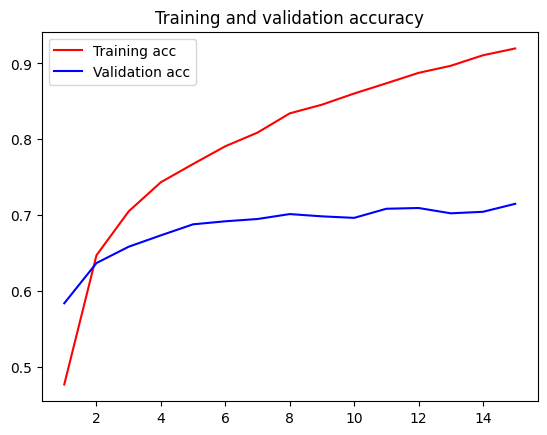

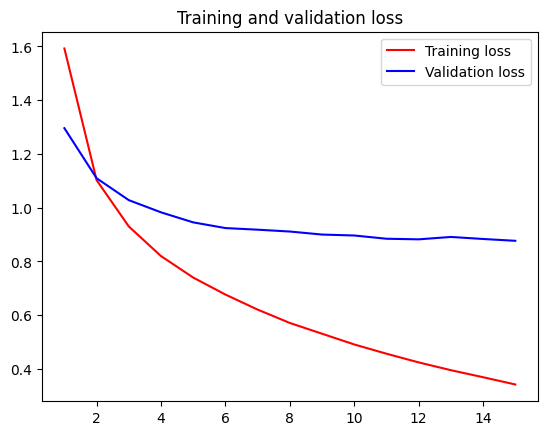

In [29]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [30]:
model2_0.save('food_model_2_0.h5')

### Model 2 (Test Model 2)

In [45]:
# Compared to previous model, the changes are:
# data augmentation

In [46]:
model2_1 = models.Sequential()

conv_base.trainable = False

for layer in conv_base.layers:
    model2_1.add(layer)
model2_1.add(layers.Flatten())
model2_1.add(layers.Dense(512, activation='relu'))
model2_1.add(layers.Dense(10, activation='softmax'))

model2_1.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,914,634 (72.15 MB)

 Trainable params: 4,199,946 (16.02 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [47]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(img_size, img_size),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

model2_1.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_1.fit(
      train_generator,
      epochs=50,
      validation_data=validation_generator,
      verbose=1)


Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Epoch 1/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - acc: 0.3078 - loss: 2.0043 - val_acc: 0.5590 - val_loss: 1.4018
Epoch 2/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - acc: 0.5304 - loss: 1.4306 - val_acc: 0.6150 - val_loss: 1.2005
Epoch 3/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.5774 - loss: 1.2694 - val_acc: 0.6435 - val_loss: 1.1084
Epoch 4/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - acc: 0.6167 - loss: 1.1644 - val_acc: 0.6505 - val_loss: 1.0509
Epoch 5/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - acc: 0.6334 - loss: 1.1228 - val_acc: 0.6665 - val_loss: 1.0154
Epoch 6/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - acc: 0.6429 - loss: 1.0817 - val_acc: 0.6695 - val_loss: 0.9932
Epoch 7/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - acc: 0.6534 - loss: 1.0332 - val_acc: 0.6750 - val_loss: 1.0021
Epoch 8/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - acc: 0.6632 - loss

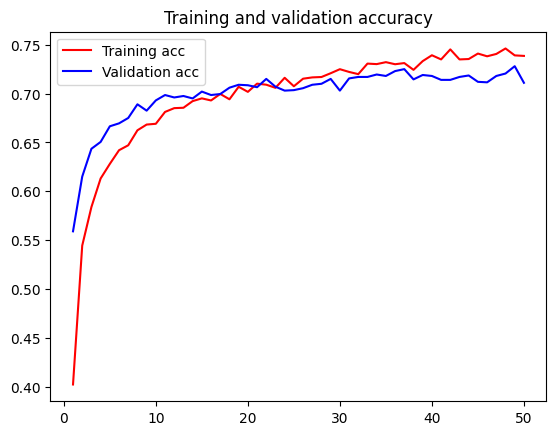

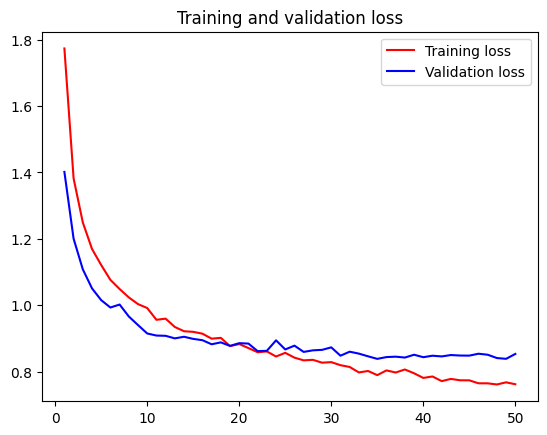

In [48]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [49]:
model2_1.save('food_model_2_1.h5')

### Model 2 (Test Model 3)

In [55]:
# Compared to previous model, the changes are:
# Training of last conv layer block in the pretrained model
# Feature Extraction with data augmentation

In [31]:
conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))

In [32]:
model2_2 = models.Sequential()
for layer in conv_base.layers:
    model2_2.add(layer)

conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True # after black5_conv1, set_trainable becomes True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False
model2_2.add(layers.Flatten())
model2_2.add(layers.Dense(512, activation='relu'))
model2_2.add(layers.Dense(10, activation='softmax'))
model2_2.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,914,634 (72.15 MB)

 Trainable params: 11,279,370 (43.03 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [33]:
model2_2.compile(loss='categorical_crossentropy',
               optimizer=optimizers.RMSprop(learning_rate=1e-5),
               metrics=['acc'])

history = model2_2.fit(
      train_generator,
      epochs=20,
      validation_data=validation_generator,
      verbose=1)

Epoch 1/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - acc: 0.3977 - loss: 1.7347 - val_acc: 0.6380 - val_loss: 1.0757
Epoch 2/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - acc: 0.7238 - loss: 0.8433 - val_acc: 0.6950 - val_loss: 0.9054
Epoch 3/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.8159 - loss: 0.5720 - val_acc: 0.7410 - val_loss: 0.8056
Epoch 4/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.8778 - loss: 0.4030 - val_acc: 0.7410 - val_loss: 0.8212
Epoch 5/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - acc: 0.9239 - loss: 0.2850 - val_acc: 0.7490 - val_loss: 0.7847
Epoch 6/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.9568 - loss: 0.1994 - val_acc: 0.7565 - val_loss: 0.7773
Epoch 7/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.9744 - loss: 0.1268 - val_acc: 0.7665 - val_loss: 0.7975
Epoch 8/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - acc: 0.9871 - loss: 0.0812 - val_acc: 0.7715 - val_loss: 0.8105
Epoch 9/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 

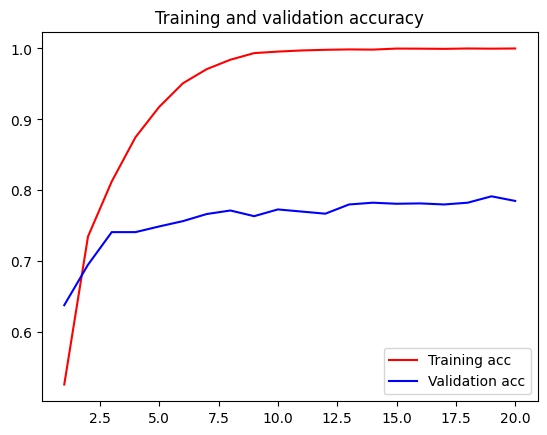

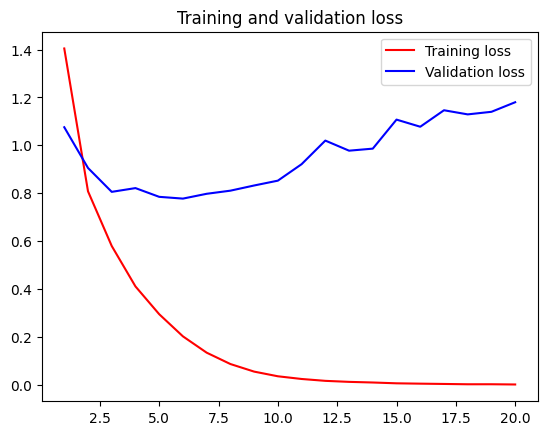

In [34]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [35]:
model2_2.save('food_model_2_2.h5')

### Model 2 (Test Model 4)

In [11]:
# Compared to previous model, the changes are:
# Used VGG19

In [4]:
from tensorflow.keras.applications import VGG19
img_size = 150

conv_base = VGG19(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))

conv_base.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
img_size = 150

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [14]:
model2_3 = models.Sequential()

conv_base.trainable = False

for layer in conv_base.layers:
    model2_3.add(layer)
model2_3.add(layers.Flatten())
model2_3.add(layers.Dense(512, activation='relu'))
model2_3.add(layers.Dense(10, activation='softmax'))

model2_3.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,224,330 (92.41 MB)

 Trainable params: 4,199,946 (16.02 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [15]:
model2_3.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_3.fit(
      train_generator,
      epochs=30,
      validation_data=validation_generator,
      verbose=1)

Epoch 1/30


2024-12-11 20:30:14.895676: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng33{k2=15,k6=0,k13=1,k14=0,k22=0} for conv (f32[20,64,150,150]{3,2,1,0}, u8[0]{0}) custom-call(f32[20,64,150,150]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2024-12-11 20:30:14.910891: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.616722658s
Trying algorithm eng33{k2=15,k6=0,k13=1,k14=0,k22=0} for conv (f32[20,64,150,150]{3,2,1,0}, u8[0]{0}) custom-call(f32[20,64,150,150]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_ca

375/375 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - acc: 0.3634 - loss: 1.8788 - val_acc: 0.5750 - val_loss: 1.3225
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - acc: 0.6120 - loss: 1.2023 - val_acc: 0.6115 - val_loss: 1.1762
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.6755 - loss: 1.0045 - val_acc: 0.6350 - val_loss: 1.1088
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - acc: 0.7176 - loss: 0.8877 - val_acc: 0.6680 - val_loss: 1.0431
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - acc: 0.7431 - loss: 0.8088 - val_acc: 0.6700 - val_loss: 1.0060
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.7651 - loss: 0.7482 - val_acc: 0.6795 - val_loss: 1.0020
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - acc: 0.7794 - loss: 0.7165 - val_acc: 0.6880 - val_loss: 0.9743
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.7981 - loss: 0.6569 - val_acc: 0.6875 - val_loss: 0.9675
Epoch 9/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/ste

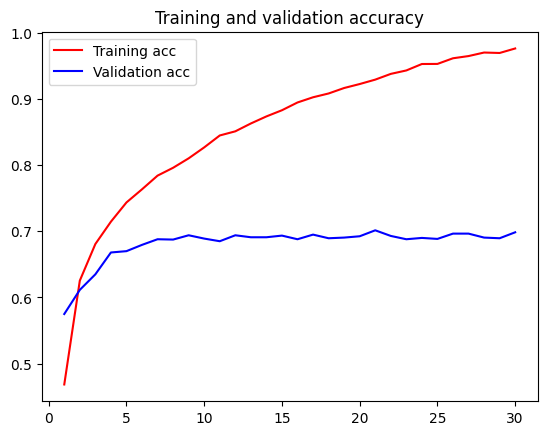

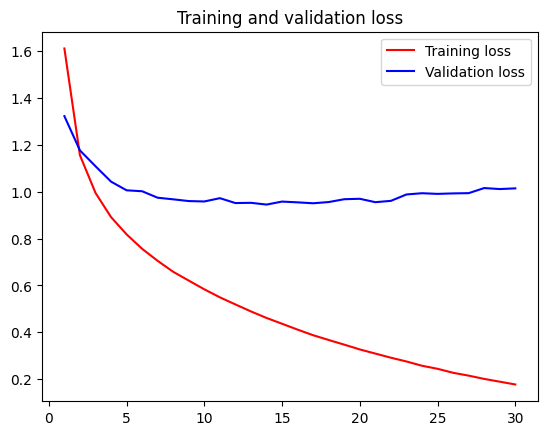

In [16]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [17]:
model2_3.save('food_model_2_3.h5')

### Model 2 (Test Model 5)

In [18]:
# Compared to previous Model, changes made are:
# Used VGG19
# Data Augmentation

In [5]:
model2_4 = models.Sequential()

conv_base.trainable = False

for layer in conv_base.layers:
    model2_4.add(layer)
model2_4.add(layers.Flatten())
model2_4.add(layers.Dense(512, activation='relu'))
model2_4.add(layers.Dense(10, activation='softmax'))

model2_4.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,224,330 (92.41 MB)

 Trainable params: 4,199,946 (16.02 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(img_size, img_size),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

model2_4.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_4.fit(
      train_generator,
      epochs=30,
      validation_data=validation_generator,
      verbose=1)


Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Epoch 1/30


/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1733922241.694363    1720 service.cc:148] XLA service 0x7f21a000e7f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733922241.694569    1720 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2024-12-11 21:04:01.730785: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1733922241.895667    1720 cuda_dnn.cc:529] Loaded cuDNN version 90300


  3/375 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - acc: 0.0611 - loss: 2.5035

I0000 00:00:1733922244.962199    1720 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - acc: 0.2803 - loss: 2.0204

/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


375/375 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - acc: 0.2805 - loss: 2.0198 - val_acc: 0.5155 - val_loss: 1.4673
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - acc: 0.5029 - loss: 1.4857 - val_acc: 0.5765 - val_loss: 1.2748
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.5519 - loss: 1.3423 - val_acc: 0.6115 - val_loss: 1.1747
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - acc: 0.5806 - loss: 1.2650 - val_acc: 0.6255 - val_loss: 1.1297
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.5919 - loss: 1.2165 - val_acc: 0.6390 - val_loss: 1.1064
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - acc: 0.5972 - loss: 1.1774 - val_acc: 0.6480 - val_loss: 1.0702
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.6122 - loss: 1.1503 - val_acc: 0.6635 - val_loss: 1.0380
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - acc: 0.6180 - loss: 1.1358 - val_acc: 0.6595 - val_loss: 1.0247
Epoch 9/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/st

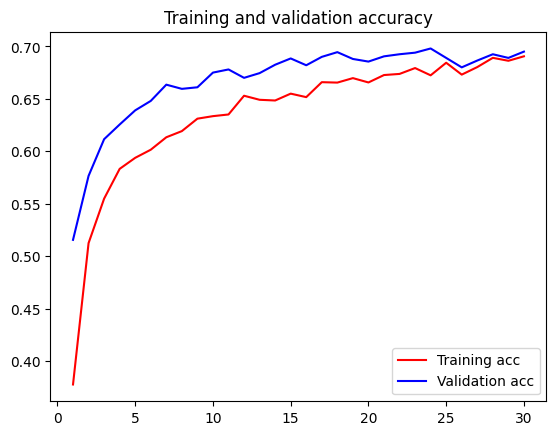

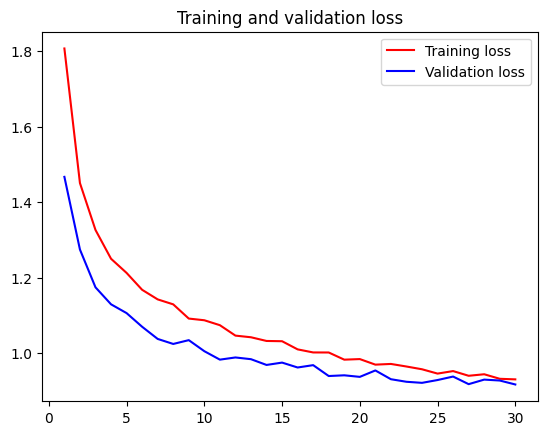

In [8]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [9]:
model2_4.save('food_model_2_4.h5')

### Model 2 (Test Model 6)

In [ ]:
# Compared to previous model, the changes are:
# Training of last conv layer block in the pretrained model
# Feature Extraction with data augmentation
# VGG19

In [13]:
conv_base = VGG19(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))

In [14]:
model2_5 = models.Sequential()
for layer in conv_base.layers:
    model2_5.add(layer)

conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True # after black5_conv1, set_trainable becomes True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False
model2_5.add(layers.Flatten())
model2_5.add(layers.Dense(512, activation='relu'))
model2_5.add(layers.Dense(10, activation='softmax'))
model2_5.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,224,330 (92.41 MB)

 Trainable params: 13,639,178 (52.03 MB)

 Non-trainable params: 10,585,152 (40.38 MB)

In [15]:
model2_5.compile(loss='categorical_crossentropy',
               optimizer=optimizers.RMSprop(learning_rate=1e-5),
               metrics=['acc'])

history = model2_5.fit(
      train_generator,
      epochs=30,
      validation_data=validation_generator,
      verbose=1)

Epoch 1/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - acc: 0.3210 - loss: 1.9160 - val_acc: 0.5785 - val_loss: 1.2326
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - acc: 0.5935 - loss: 1.1856 - val_acc: 0.6515 - val_loss: 1.0172
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - acc: 0.6656 - loss: 0.9889 - val_acc: 0.7090 - val_loss: 0.8731
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.7022 - loss: 0.8679 - val_acc: 0.7415 - val_loss: 0.8038
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - acc: 0.7280 - loss: 0.8251 - val_acc: 0.7450 - val_loss: 0.7998
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - acc: 0.7432 - loss: 0.7773 - val_acc: 0.7605 - val_loss: 0.7440
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - acc: 0.7603 - loss: 0.7085 - val_acc: 0.7625 - val_loss: 0.7352
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - acc: 0.7707 - loss: 0.6724 - val_acc: 0.7755 - val_loss: 0.6734
Epoch 9/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 

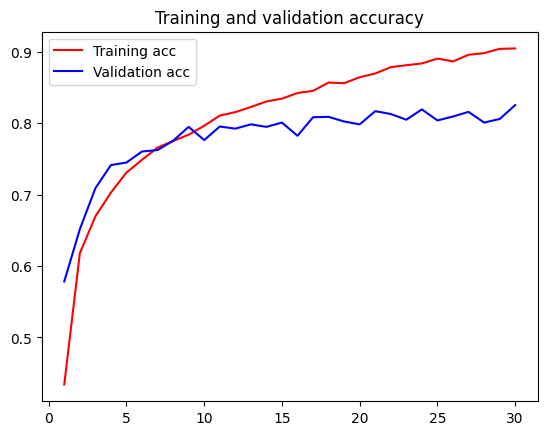

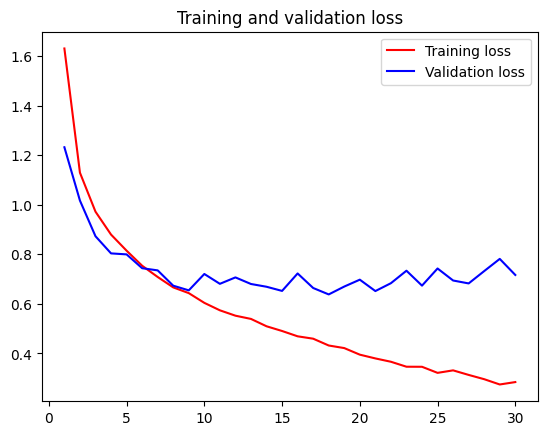

In [16]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [17]:
model2_5.save('food_model_2_5.h5')

### Model 2 (Test model 7)

In [ ]:
# Compared to previous model, changes made are:
# InceptionV3

In [36]:
from tensorflow.keras.applications import InceptionV3
img_size = 150

conv_base = InceptionV3(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))

In [37]:
conv_base.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 74, 74,    │        864 │ input_layer_6[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 74, 74,    │         96 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 74, 74,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 72, 72,    │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │         96 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 72, 72,    │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │        192 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_18    │ (None, 35, 35,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 35, 35,    │      5,120 │ max_pooling2d_18… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 35, 35,    │        240 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 35, 35,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 33, 33,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 33, 33,    │        576 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 33, 33,    │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [68]:
img_size = 150

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [39]:
model2_6 = models.Sequential()

conv_base.trainable = False

model2_6.add(conv_base)
model2_6.add(layers.Flatten())
model2_6.add(layers.Dense(512, activation='relu'))
model2_6.add(layers.Dense(10, activation='softmax'))

model2_6.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 3, 3, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,245,610 (119.19 MB)

 Trainable params: 9,442,826 (36.02 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [40]:
model2_6.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_6.fit(
      train_generator,
      epochs=17,
      validation_data=validation_generator,
      verbose=1)

Epoch 1/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - acc: 0.5418 - loss: 1.5999 - val_acc: 0.7145 - val_loss: 0.9511
Epoch 2/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - acc: 0.7834 - loss: 0.6574 - val_acc: 0.7400 - val_loss: 0.8841
Epoch 3/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - acc: 0.8767 - loss: 0.3878 - val_acc: 0.7470 - val_loss: 0.8855
Epoch 4/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.9249 - loss: 0.2330 - val_acc: 0.7435 - val_loss: 0.9143
Epoch 5/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - acc: 0.9604 - loss: 0.1375 - val_acc: 0.7205 - val_loss: 1.0683
Epoch 6/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - acc: 0.9787 - loss: 0.0842 - val_acc: 0.7405 - val_loss: 0.9653
Epoch 7/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - acc: 0.9874 - loss: 0.0567 - val_acc: 0.7545 - val_loss: 0.9504
Epoch 8/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - acc: 0.9926 - loss: 0.0348 - val_acc: 0.7570 - val_loss: 0.9625
Epoch 9/17
375/375 ━━━━━━━━━━━━━━━━━━━━ 

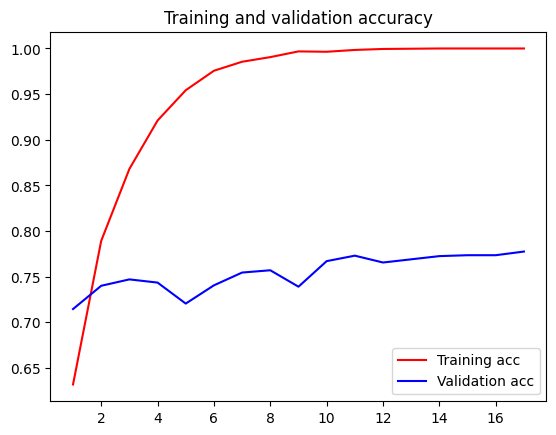

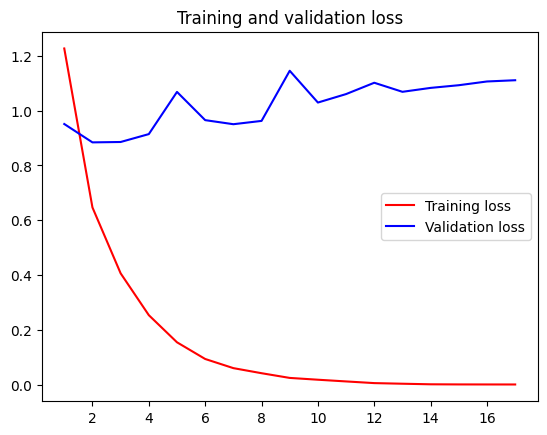

In [41]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [42]:
model2_6.save('food_model_2_6.h5')

### Model 2 (Test Model 8)

In [ ]:
# Compared to previous model, changes made are:
# Xception

In [43]:
from tensorflow.keras.applications import Xception
img_size = 150

conv_base = Xception(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))
conv_base.summary()

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 74, 74,    │        864 │ input_layer_8[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 74, 74,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 74, 74,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 72, 72,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 72, 72,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 72, 72,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 72, 72,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 72, 72,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 72, 72,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 72, 72,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 72, 72,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_112 (Conv2D) │ (None, 36, 36,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 36, 36,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 36, 36,    │        512 │ conv2d_112[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 36, 36,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 36, 36,    │          0 │ add[0][0]       

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 20,806,952 (79.37 MB)

 Non-trainable params: 54,528 (213.00 KB)

In [44]:
model2_7 = models.Sequential()

conv_base.trainable = False

model2_7.add(conv_base)
model2_7.add(layers.Flatten())
model2_7.add(layers.Dense(512, activation='relu'))
model2_7.add(layers.Dense(10, activation='softmax'))

model2_7.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ xception (Functional)           │ (None, 5, 5, 2048)     │    20,861,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 512)            │    26,214,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,081,522 (179.60 MB)

 Trainable params: 26,220,042 (100.02 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [45]:
model2_7.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_7.fit(
      train_generator,
      epochs=9,
      validation_data=validation_generator,
      verbose=1)

Epoch 1/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - acc: 0.6322 - loss: 1.1389 - val_acc: 0.7065 - val_loss: 0.9017
Epoch 2/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - acc: 0.8357 - loss: 0.4820 - val_acc: 0.7500 - val_loss: 0.7959
Epoch 3/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.8920 - loss: 0.3047 - val_acc: 0.7695 - val_loss: 0.7643
Epoch 4/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - acc: 0.9431 - loss: 0.1787 - val_acc: 0.7825 - val_loss: 0.7689
Epoch 5/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - acc: 0.9693 - loss: 0.1128 - val_acc: 0.7755 - val_loss: 0.8324
Epoch 6/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - acc: 0.9849 - loss: 0.0644 - val_acc: 0.7775 - val_loss: 0.8725
Epoch 7/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.9893 - loss: 0.0414 - val_acc: 0.7790 - val_loss: 0.8802
Epoch 8/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.9951 - loss: 0.0263 - val_acc: 0.7800 - val_loss: 0.9207
Epoch 9/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/s

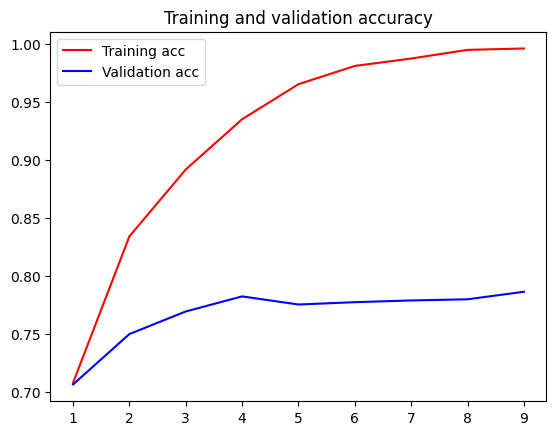

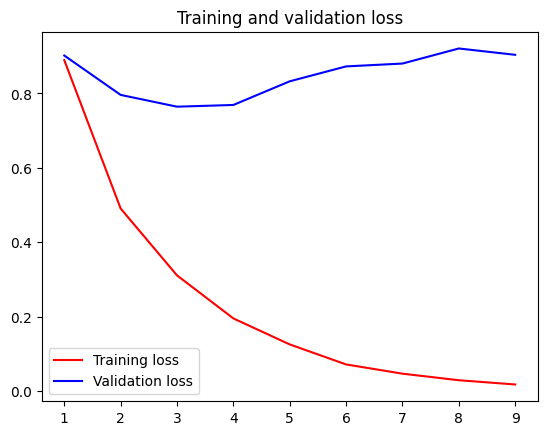

In [46]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [47]:
model2_7.save('food_model_2_7.h5')

### Model 2 (Test Model 9)

In [43]:
# Compared to previous model, changes made are:
# DenseNet169

In [4]:
from tensorflow.keras.applications import DenseNet169
img_size = 150

conv_base = DenseNet169(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))
conv_base.summary()

I0000 00:00:1734193658.715713  130260 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7537 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:0a:00.0, compute capability: 8.6


Model: "densenet169"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 156, 156,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 75, 75,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 75, 75,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 75, 75,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 77, 77,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 38, 38,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 38, 38,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 38, 38,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 38, 38,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 38, 38,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 38, 38,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 38, 38,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 38, 38,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 38, 38,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 38, 38,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 38, 38,    │     12,288 │ conv2_block2_0_r

 Total params: 12,642,880 (48.23 MB)

 Trainable params: 12,484,480 (47.62 MB)

 Non-trainable params: 158,400 (618.75 KB)

In [73]:
model2_8 = models.Sequential()

conv_base.trainable = False

model2_8.add(conv_base)
model2_8.add(layers.Flatten())
model2_8.add(layers.Dense(512, activation='relu'))
model2_8.add(layers.Dense(10, activation='softmax'))

model2_8.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet169 (Functional)        │ (None, 4, 4, 1664)     │    12,642,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 26624)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │    13,632,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,280,010 (100.25 MB)

 Trainable params: 13,637,130 (52.02 MB)

 Non-trainable params: 12,642,880 (48.23 MB)

In [74]:
model2_8.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_8.fit(
      train_generator,
      epochs=9, # 9
      validation_data=validation_generator,
      verbose=1)

Epoch 1/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - acc: 0.6033 - loss: 1.3046 - val_acc: 0.8040 - val_loss: 0.6153
Epoch 2/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - acc: 0.8570 - loss: 0.4333 - val_acc: 0.8200 - val_loss: 0.5773
Epoch 3/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - acc: 0.9349 - loss: 0.2133 - val_acc: 0.8285 - val_loss: 0.5612
Epoch 4/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - acc: 0.9668 - loss: 0.1192 - val_acc: 0.8150 - val_loss: 0.6265
Epoch 5/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - acc: 0.9886 - loss: 0.0616 - val_acc: 0.8395 - val_loss: 0.5920
Epoch 6/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - acc: 0.9943 - loss: 0.0339 - val_acc: 0.8380 - val_loss: 0.6080
Epoch 7/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - acc: 0.9981 - loss: 0.0180 - val_acc: 0.8365 - val_loss: 0.6585
Epoch 8/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - acc: 0.9994 - loss: 0.0097 - val_acc: 0.8415 - val_loss: 0.6440
Epoch 9/9
375/375 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/

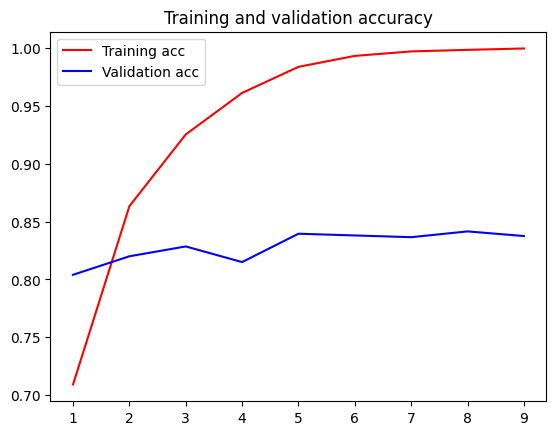

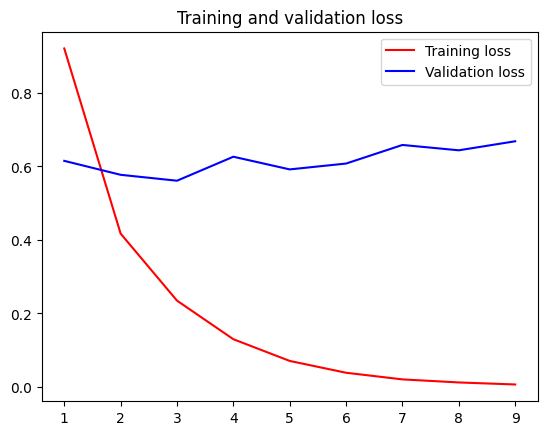

In [75]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [52]:
model2_8.save('food_model_2_8.h5')

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Epoch 1/10


/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734193698.723950  130764 service.cc:148] XLA service 0x7f7d40003fd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734193698.724155  130764 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2024-12-15 00:28:22.635020: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1734193706.266029  130764 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:17341937

375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - acc: 0.4921 - loss: 1.5609

/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


375/375 ━━━━━━━━━━━━━━━━━━━━ 162s 111ms/step - acc: 0.4925 - loss: 1.5597 - val_acc: 0.8185 - val_loss: 0.5725
Epoch 2/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - acc: 0.7869 - loss: 0.6731 - val_acc: 0.8605 - val_loss: 0.4755
Epoch 3/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - acc: 0.8368 - loss: 0.4821 - val_acc: 0.8560 - val_loss: 0.5034
Epoch 4/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - acc: 0.8641 - loss: 0.4118 - val_acc: 0.8785 - val_loss: 0.4695
Epoch 5/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 32s 85ms/step - acc: 0.8856 - loss: 0.3502 - val_acc: 0.8735 - val_loss: 0.5209
Epoch 6/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - acc: 0.8986 - loss: 0.3159 - val_acc: 0.8495 - val_loss: 0.6138
Epoch 7/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - acc: 0.9106 - loss: 0.2688 - val_acc: 0.8775 - val_loss: 0.5215
Epoch 8/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - acc: 0.9220 - loss: 0.2402 - val_acc: 0.8850 - val_loss: 0.5021
Epoch 9/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/

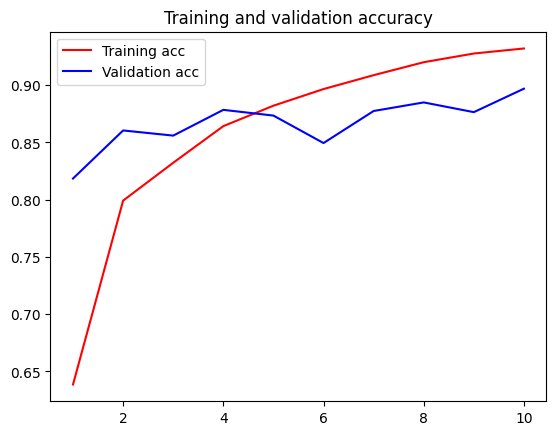

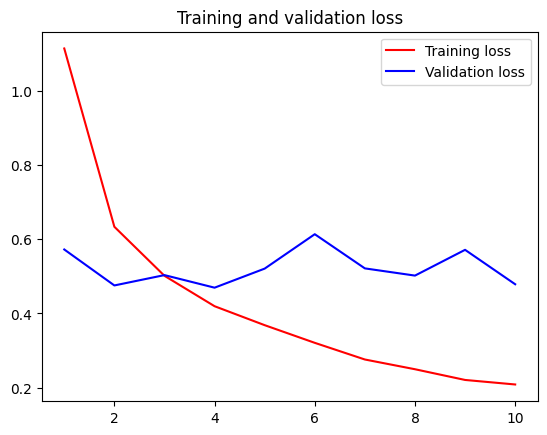

In [5]:
model_2_81 = models.Sequential()
model_2_81.add(conv_base)
model_2_81.add(layers.Flatten())
model_2_81.add(layers.Dense(512, activation='relu'))
model_2_81.add(layers.Dense(10, activation='softmax'))
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(img_size, img_size),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')
model_2_81.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model_2_81.fit(
      train_generator,
      epochs=10,
      validation_data=validation_generator,
      verbose=1)
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [6]:
model_2_81.save('food_model_2_81.h5')

### Model 2 (Test Model 10)

In [ ]:
# Compared to previous model, changes made are:
# MobileNetV2

In [53]:
from tensorflow.keras.applications import MobileNetV2
img_size = 150

conv_base = MobileNetV2(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))
conv_base.summary()

/tmp/ipykernel_906/607814587.py:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  conv_base = MobileNetV2(weights='imagenet',


Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_12[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [54]:
model2_9 = models.Sequential()

conv_base.trainable = False

model2_9.add(conv_base)
model2_9.add(layers.Flatten())
model2_9.add(layers.Dense(512, activation='relu'))
model2_9.add(layers.Dense(10, activation='softmax'))

model2_9.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 32000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │    16,384,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,647,626 (71.14 MB)

 Trainable params: 16,389,642 (62.52 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [55]:
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

model2_9.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model2_9.fit(
      train_generator,
      epochs=8,
      validation_data=validation_generator,
      verbose=1)

Epoch 1/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - acc: 0.6039 - loss: 1.2945 - val_acc: 0.7575 - val_loss: 0.7515
Epoch 2/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - acc: 0.9048 - loss: 0.3081 - val_acc: 0.7730 - val_loss: 0.7699
Epoch 3/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.9714 - loss: 0.1006 - val_acc: 0.7850 - val_loss: 0.7696
Epoch 4/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 0.9953 - loss: 0.0281 - val_acc: 0.7855 - val_loss: 0.7811
Epoch 5/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - acc: 0.9988 - loss: 0.0099 - val_acc: 0.7880 - val_loss: 0.8680
Epoch 6/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - acc: 1.0000 - loss: 0.0033 - val_acc: 0.7995 - val_loss: 0.8539
Epoch 7/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - acc: 1.0000 - loss: 8.2196e-04 - val_acc: 0.8025 - val_loss: 0.8572
Epoch 8/8
375/375 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - acc: 1.0000 - loss: 3.8214e-04 - val_acc: 0.8065 - val_loss: 0.8637


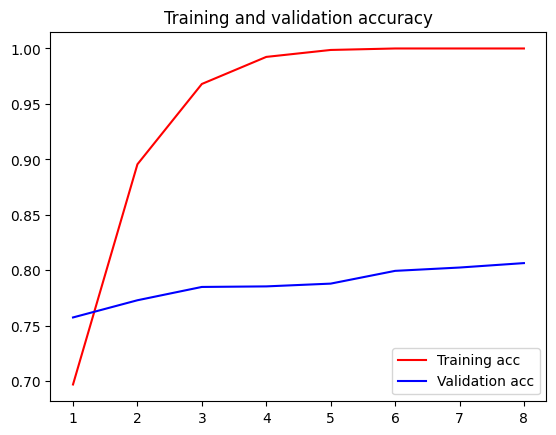

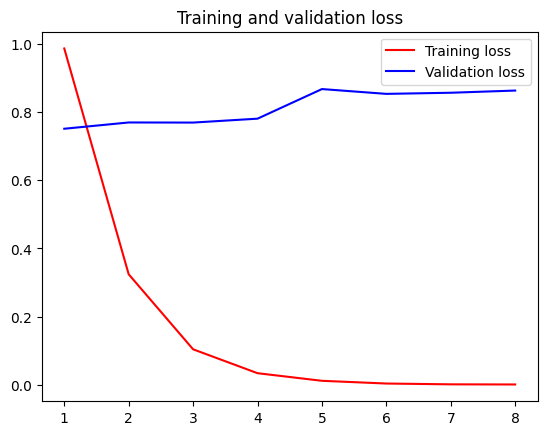

In [56]:
# Plot the Training and Validation Accuracy & Loss Scores
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [57]:
model2_9.save('food_model_2_9.h5')

In [ ]:
# Save the Model
#model2.save('food_model_2.h5')

## Step 3 – Evaluate the Developed Models using Testing Images

In [7]:
img_size = 150

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical')

Found 500 images belonging to 10 classes.


In [43]:
# Model #1.0
model_10 = keras.models.load_model('food_model_1_0.h5')

test_loss, test_acc = model_10.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.5254 - loss: 1.5123
test acc: 0.5040000081062317
test loss: 1.5141477584838867


In [44]:
# Model #1.1
model_11 = keras.models.load_model('food_model_1_1.h5')

test_loss, test_acc = model_11.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - acc: 0.4643 - loss: 2.5449 
test acc: 0.4699999988079071
test loss: 2.4924514293670654


In [45]:
# Model #1.2
model_12 = keras.models.load_model('food_model_1_2.h5')

test_loss, test_acc = model_12.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.4940 - loss: 1.5153
test acc: 0.5040000081062317
test loss: 1.4961518049240112


In [46]:
# Model #1.3
model_13 = keras.models.load_model('food_model_1_3.h5')

test_loss, test_acc = model_13.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - acc: 0.4776 - loss: 1.8227 
test acc: 0.4819999933242798
test loss: 1.8017511367797852


In [47]:
# Model #1.4
model_14 = keras.models.load_model('food_model_1_4.h5')

test_loss, test_acc = model_14.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.5117 - loss: 1.7495
test acc: 0.5059999823570251
test loss: 1.7818890810012817


In [48]:
# Model #1.5
model_15 = keras.models.load_model('food_model_1_5.h5')

test_loss, test_acc = model_15.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - acc: 0.6114 - loss: 1.2360 
test acc: 0.6159999966621399
test loss: 1.2302292585372925


In [49]:
# Model #1.6
model_16 = keras.models.load_model('food_model_1_6.h5')

test_loss, test_acc = model_16.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - acc: 0.6307 - loss: 1.1589 
test acc: 0.621999979019165
test loss: 1.1764475107192993


In [50]:
# Model #1.7
model_17 = keras.models.load_model('food_model_1_7.h5')

test_loss, test_acc = model_17.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - acc: 0.5796 - loss: 1.4000 
test acc: 0.5699999928474426
test loss: 1.4247239828109741


In [51]:
# Model #2.0
model_20 = keras.models.load_model('food_model_2_0.h5')

test_loss, test_acc = model_20.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.7215 - loss: 0.8570
test acc: 0.722000002861023
test loss: 0.8680962920188904


In [52]:
# Model #2.1
model_21 = keras.models.load_model('food_model_2_1.h5')

test_loss, test_acc = model_21.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.7374 - loss: 0.8603
test acc: 0.734000027179718
test loss: 0.8608846664428711


In [53]:
# Model #2.2
model_22 = keras.models.load_model('food_model_2_2.h5')

test_loss, test_acc = model_22.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.8186 - loss: 1.0693
test acc: 0.8080000281333923
test loss: 1.0781409740447998


In [54]:
# Model #2.3
model_23 = keras.models.load_model('food_model_2_3.h5')

test_loss, test_acc = model_23.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.6707 - loss: 0.9813
test acc: 0.6959999799728394
test loss: 0.9129061102867126


In [55]:
# Model #2.4
model_24 = keras.models.load_model('food_model_2_4.h5')

test_loss, test_acc = model_24.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.7145 - loss: 0.8486
test acc: 0.7020000219345093
test loss: 0.9001300930976868


In [56]:
# Model #2.5
model_25 = keras.models.load_model('food_model_2_5.h5')

test_loss, test_acc = model_25.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - acc: 0.8296 - loss: 0.7512
test acc: 0.8320000171661377
test loss: 0.7701340317726135


In [57]:
# Model #2.6
model_26 = keras.models.load_model('food_model_2_6.h5')

test_loss, test_acc = model_26.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - acc: 0.7584 - loss: 1.0392
test acc: 0.7639999985694885
test loss: 1.0130771398544312


In [58]:
# Model #2.7
model_27 = keras.models.load_model('food_model_2_7.h5')

test_loss, test_acc = model_27.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - acc: 0.7674 - loss: 0.8529
test acc: 0.7799999713897705
test loss: 0.8232132196426392


In [59]:
# Model #2.8
model_28 = keras.models.load_model('food_model_2_8.h5')

test_loss, test_acc = model_28.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - acc: 0.8293 - loss: 0.7220
test acc: 0.8360000252723694
test loss: 0.6676127314567566


In [8]:
# Model #2.81
model_281 = keras.models.load_model('food_model_2_81.h5')

test_loss, test_acc = model_281.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - acc: 0.9082 - loss: 0.4654
test acc: 0.9079999923706055
test loss: 0.4973253607749939


/home/louis/pythonenv/pythonenvironment/louispython/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


In [60]:
# Model #2.9
model_29 = keras.models.load_model('food_model_2_9.h5')

test_loss, test_acc = model_29.evaluate(test_generator, steps=50)
print('test acc:', test_acc)
print('test loss:', test_loss)

50/50 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - acc: 0.8022 - loss: 0.9501 
test acc: 0.8119999766349792
test loss: 0.9099763631820679


In [9]:
# Save the best model

model_281.save('food_model_best.h5')

## Step 4  – Use the best model to make prediction

In [10]:
# Load the model
model = keras.models.load_model('food_model_best.h5')

In [11]:
# Load the food list (in alphabetical order)
with open('./Food_list/Food_list/49.txt', 'r') as f: # the .txt file which contains a list of food assigned to you
    x = f.readlines()
food_list =[]
for item in x:
    food_list.append(item.strip('\n'))
food_list = sorted(food_list) # food_list needs to be sorted alphabetically before feed into prediction() function
print(food_list)

['beignets', 'breakfast_burrito', 'clam_chowder', 'creme_brulee', 'croque_madame', 'cup_cakes', 'french_onion_soup', 'hummus', 'pad_thai', 'shrimp_and_grits']


In [12]:
# Define some related functions for image process and model prediction
from tensorflow.keras.preprocessing.image import load_img, img_to_array
img_size = 150

def image_process(img):
    image = load_img(img, target_size =(img_size, img_size))
    image_array = img_to_array(image)/255
    return image_array

import pandas as pd
def prediction(model, img_array, items_l):
    prob = model.predict(img_array.reshape(1,img_size,img_size,3))
    pro_df = pd.DataFrame(prob, columns = items_l)
    result = items_l[np.argmax(prob)]
    return pro_df, result

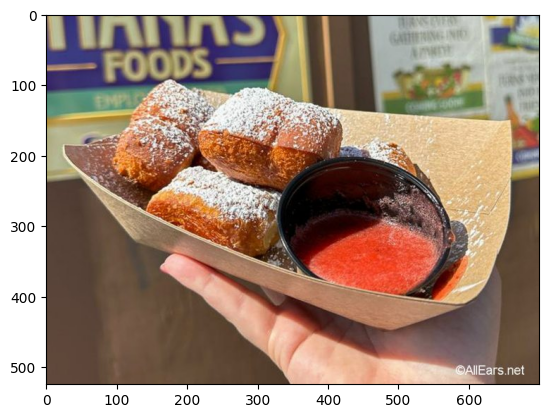

2024-12-15 00:38:44.961091: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng28{k2=3,k3=0} for conv (f32[1,128,9,9]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,960,9,9]{3,2,1,0}, f32[128,960,1,1]{3,2,1,0}), window={size=1x1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2024-12-15 00:38:44.962545: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 2.319487934s
Trying algorithm eng28{k2=3,k3=0} for conv (f32[1,128,9,9]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,960,9,9]{3,2,1,0}, f32[128,960,1,1]{3,2,1,0}), window={size=1x1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_re

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
The prediction is:  beignets 

    beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0   0.99999       1.620347e-09  1.033736e-12       0.00001   9.520835e-11   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  1.644574e-09       4.080478e-10  7.706418e-10  6.116806e-12   

   shrimp_and_grits  
0      1.172784e-13  


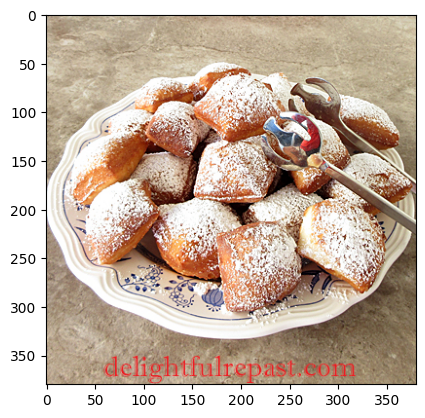

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
The prediction is:  beignets 

    beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  0.980812       1.569539e-07  3.195027e-10  2.237104e-07   2.249133e-13   

   cup_cakes  french_onion_soup        hummus      pad_thai  shrimp_and_grits  
0   0.019187       2.080403e-11  1.253001e-10  4.365160e-10      1.030095e-10  


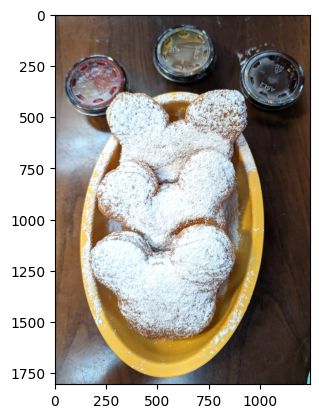

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
The prediction is:  beignets 

    beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  0.999265       4.218277e-09      0.000716      0.000008   2.163635e-10   

   cup_cakes  french_onion_soup        hummus      pad_thai  shrimp_and_grits  
0   0.000009       9.383144e-07  1.439779e-07  1.450445e-09      3.572538e-08  


In [13]:
# Beignets

# Make prediction for the image you downloaded from internet
import matplotlib.pyplot as plt
img = 'new_test_images/beignets_1.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# Make prediction for the image you downloaded from internet
import matplotlib.pyplot as plt
img = 'new_test_images/beignets_2.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

# Make prediction for the image you downloaded from internet
import matplotlib.pyplot as plt
img = 'new_test_images/beignets_3.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

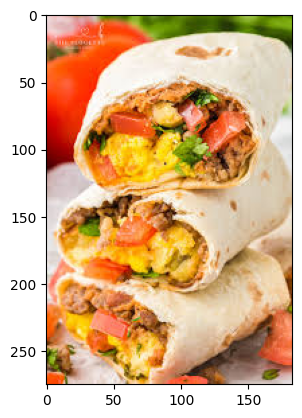

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The prediction is:  breakfast_burrito 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  6.568012e-14           0.999982  5.200173e-08  6.258285e-13       0.000007   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  1.063440e-11       6.035392e-11  2.074543e-08  1.869812e-08   

   shrimp_and_grits  
0          0.000011  


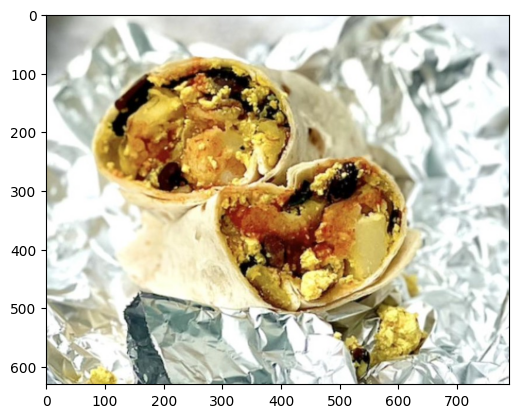

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
The prediction is:  breakfast_burrito 

    beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  0.000002           0.989668  1.663332e-07      0.000425   4.036322e-07   

      cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0  8.209507e-07           0.000001  0.007759  0.002141          0.000003  


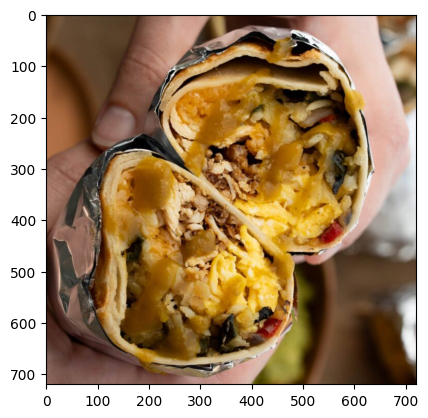

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
The prediction is:  breakfast_burrito 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.192107e-10           0.999559      0.000003  4.163897e-09   2.544184e-07   

      cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0  8.448831e-07           0.000142  0.000259  0.000035      1.199869e-07  


In [14]:
# Breakfast Burrito

import matplotlib.pyplot as plt
img = 'new_test_images/breakfast_burrito_1.jpeg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/breakfast_burrito_2.jpeg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/breakfast_burrito_3.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

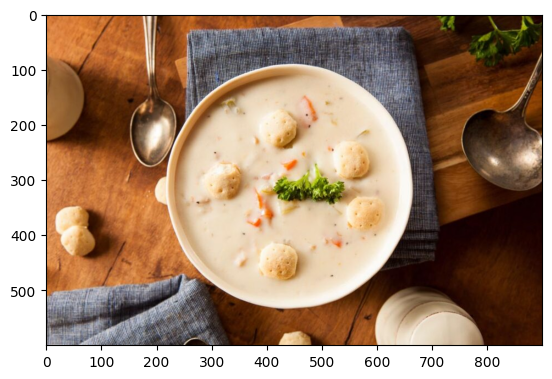

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
The prediction is:  clam_chowder 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  2.213069e-13       2.143418e-12      0.999999  6.172204e-11   2.387381e-10   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  3.639135e-13       7.595403e-07  3.710558e-07  2.120353e-10   

   shrimp_and_grits  
0      4.101391e-08  


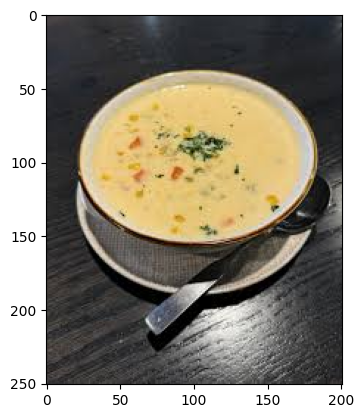

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
The prediction is:  clam_chowder 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.872312e-16       3.484636e-15           1.0  9.550616e-14   4.594597e-12   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  1.771310e-17       4.701725e-12  1.347360e-11  1.684887e-14   

   shrimp_and_grits  
0      3.454802e-15  


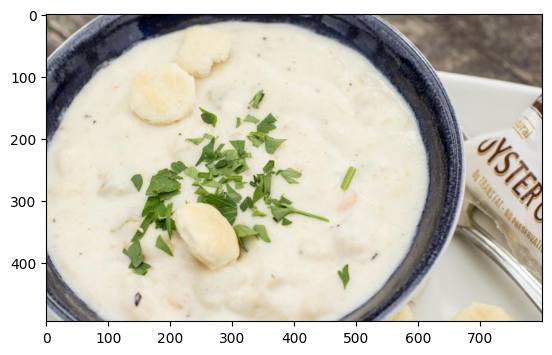

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
The prediction is:  clam_chowder 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  8.183293e-10       2.158130e-09       0.99999  4.256994e-09   6.615386e-07   

      cup_cakes  french_onion_soup    hummus      pad_thai  shrimp_and_grits  
0  1.264552e-11           0.000001  0.000008  1.506667e-08      2.275614e-07  


In [15]:
# Clam Chowder

import matplotlib.pyplot as plt
img = 'new_test_images/clam_chowder_1.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/clam_chowder_2.jpeg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/clam_chowder_3.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

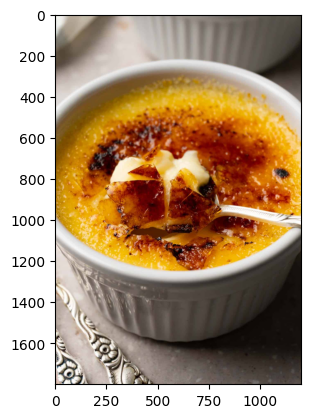

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
The prediction is:  creme_brulee 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  9.352379e-14       2.381442e-12  5.301476e-09      0.999991   9.103378e-14   

      cup_cakes  french_onion_soup    hummus      pad_thai  shrimp_and_grits  
0  1.179550e-15           0.000007  0.000003  3.365346e-13      6.915539e-12  


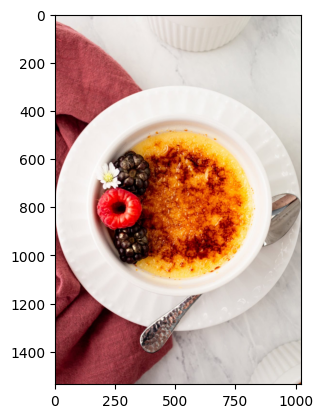

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
The prediction is:  creme_brulee 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  7.602903e-15       1.940406e-11  2.206787e-16           1.0   1.384348e-12   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  2.336658e-13       1.142156e-11  5.476874e-08  9.243035e-13   

   shrimp_and_grits  
0      3.523527e-11  


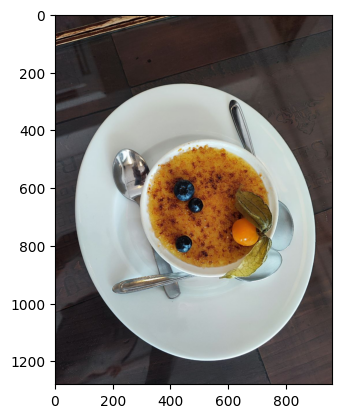

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
The prediction is:  creme_brulee 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  8.246773e-11       6.364607e-11  3.882309e-12      0.999999   1.051223e-10   

      cup_cakes  french_onion_soup    hummus      pad_thai  shrimp_and_grits  
0  8.907500e-12       4.421683e-09  0.000001  1.220848e-10      1.246647e-08  


In [16]:
# Creme Brulee

import matplotlib.pyplot as plt
img = 'new_test_images/creme_brulee_1.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/creme_brulee_2.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/creme_brulee_3.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

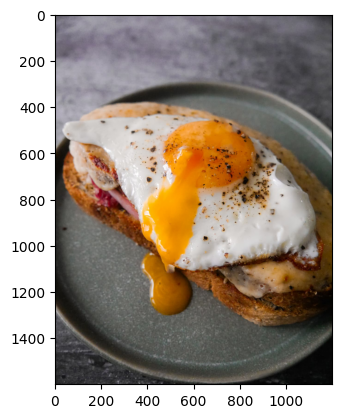

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
The prediction is:  croque_madame 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  5.058267e-10       1.025738e-10  2.009994e-15  5.571248e-11            1.0   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  2.363334e-11       4.708902e-13  1.593035e-15  2.374485e-15   

   shrimp_and_grits  
0      2.231414e-11  


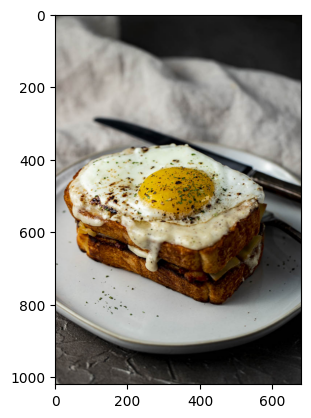

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
The prediction is:  croque_madame 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.397478e-10       2.544443e-11  3.682553e-14  4.416708e-12            1.0   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  4.272393e-07       1.847503e-13  4.598220e-10  1.597526e-11   

   shrimp_and_grits  
0      4.478603e-11  


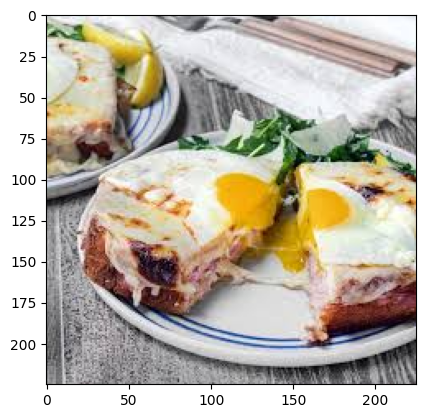

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
The prediction is:  croque_madame 

    beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  0.000005           0.000152  7.242928e-10  5.798267e-08       0.999842   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  7.753946e-10       2.274248e-09  6.599125e-07  6.093060e-08   

   shrimp_and_grits  
0      3.295252e-11  


In [17]:
# Croque Madame

import matplotlib.pyplot as plt
img = 'new_test_images/croque_madame_1.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/croque_madame_2.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/croque_madame_3.jpeg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

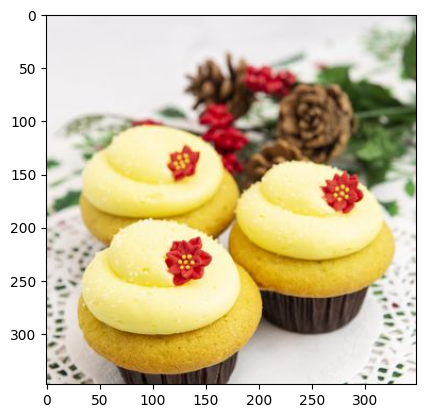

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
The prediction is:  cup_cakes 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.620577e-19       2.098775e-19  1.296928e-23  4.214313e-14   2.990905e-17   

   cup_cakes  french_onion_soup        hummus      pad_thai  shrimp_and_grits  
0        1.0       2.528033e-21  6.796191e-16  1.099029e-19      2.608993e-17  


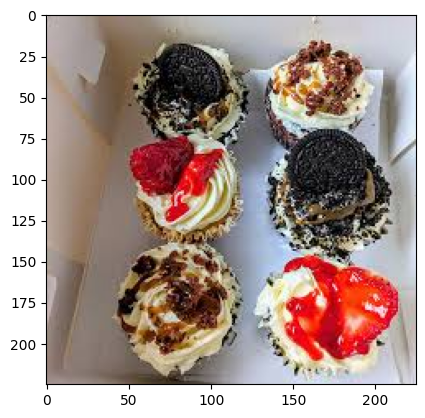

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
The prediction is:  cup_cakes 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.130090e-09           0.000009  2.012508e-11      0.002963   1.512632e-09   

   cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0   0.996994       3.714691e-10  0.000025  0.000009      5.268339e-12  


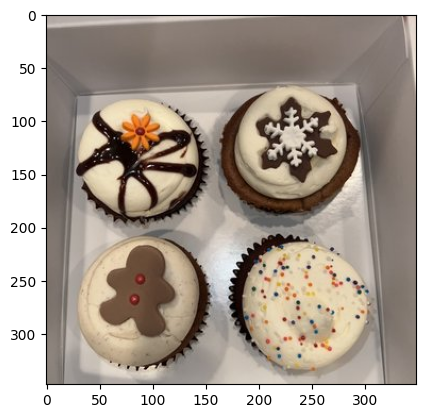

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
The prediction is:  cup_cakes 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  5.358059e-12       1.666656e-13  1.415607e-09  5.757375e-13   3.250610e-11   

   cup_cakes  french_onion_soup        hummus      pad_thai  shrimp_and_grits  
0        1.0       1.409005e-15  2.476523e-09  8.076741e-13      1.124854e-11  


In [18]:
# Cup Cakes

import matplotlib.pyplot as plt
img = 'new_test_images/cup_cakes_1.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/cup_cakes_2.jpeg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/cup_cakes_3.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

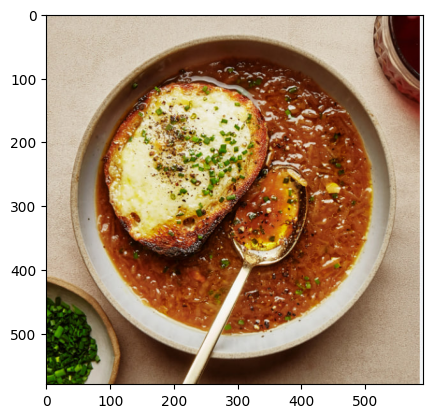

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
The prediction is:  french_onion_soup 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.258709e-12       3.376068e-13  2.039510e-10      0.081562       0.000011   

   cup_cakes  french_onion_soup        hummus  pad_thai  shrimp_and_grits  
0   0.000013           0.918283  1.030514e-07  0.000129          0.000002  


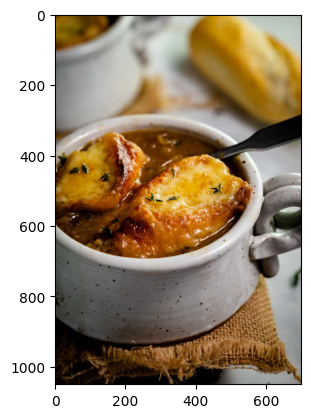

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
The prediction is:  french_onion_soup 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.458000e-11       4.116136e-11  1.786263e-11  6.262688e-08   2.988885e-10   

      cup_cakes  french_onion_soup        hummus      pad_thai  \
0  4.237979e-14                1.0  1.945087e-10  6.343022e-10   

   shrimp_and_grits  
0      7.910409e-08  


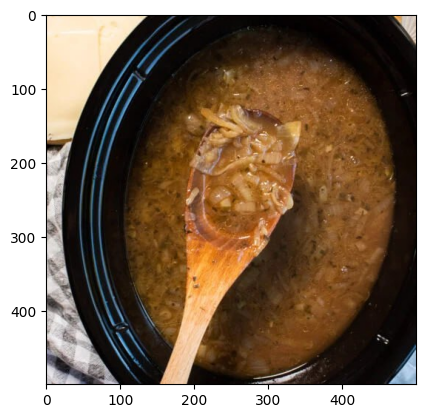

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
The prediction is:  french_onion_soup 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.437396e-07           0.007029      0.419878      0.005084   9.032458e-07   

   cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0   0.000001           0.488988  0.078992  0.000024          0.000003  


In [19]:
# French Onion Soup

import matplotlib.pyplot as plt
img = 'new_test_images/french_onion_soup_1.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/french_onion_soup_2.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/french_onion_soup_3.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

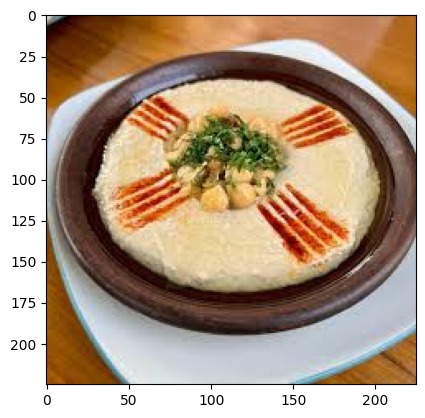

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
The prediction is:  hummus 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.170833e-08           0.000007      0.000094      0.001211       0.000033   

      cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0  3.801777e-07           0.000024  0.998623  0.000003          0.000004  


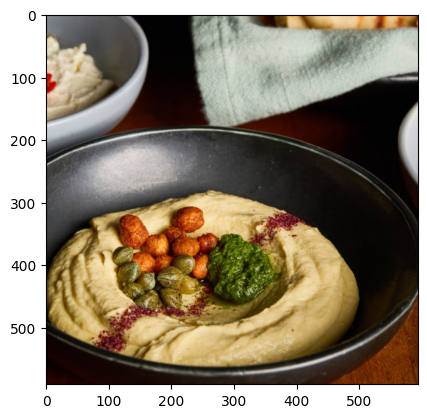

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
The prediction is:  hummus 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  2.100011e-09            0.00001      0.000004      0.000009       0.000023   

      cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0  4.575943e-08           0.000251  0.998769  0.000027          0.000907  


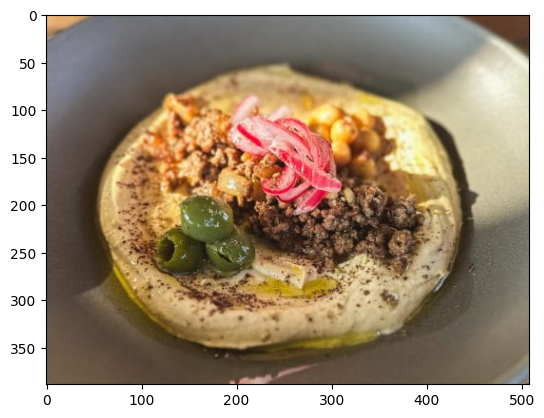

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
The prediction is:  hummus 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  6.568497e-11       3.043317e-08  2.591364e-10      0.003396   1.561712e-07   

   cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0   0.000002           0.000001  0.996535  0.000006          0.000059  


In [20]:
# Hummus

import matplotlib.pyplot as plt
img = 'new_test_images/hummus_1.jpeg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/hummus_2.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/hummus_3.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

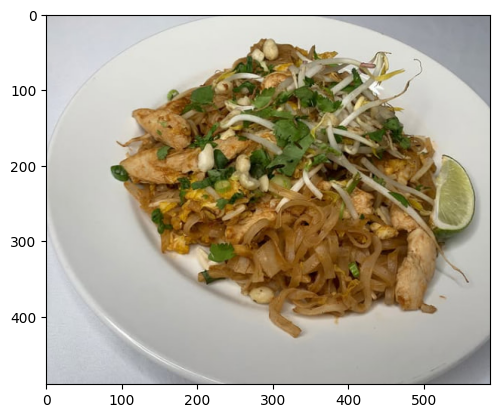

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
The prediction is:  pad_thai 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.072048e-18       3.435307e-11  2.698954e-12  1.816548e-14   7.940546e-10   

      cup_cakes  french_onion_soup        hummus  pad_thai  shrimp_and_grits  
0  3.275825e-14       3.985818e-10  4.122252e-10       1.0      1.056133e-09  


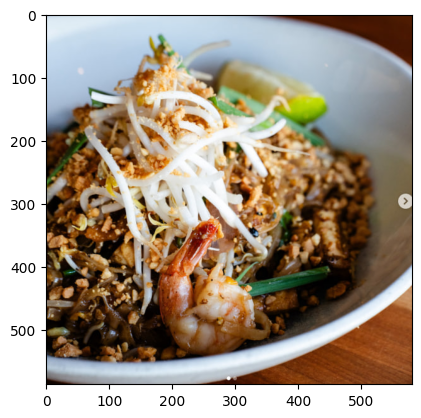

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
The prediction is:  pad_thai 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.732135e-15       8.937187e-13  4.572468e-13  7.920386e-13   1.515671e-10   

      cup_cakes  french_onion_soup        hummus  pad_thai  shrimp_and_grits  
0  5.631965e-15       1.017997e-09  1.259367e-09       1.0      1.434938e-12  


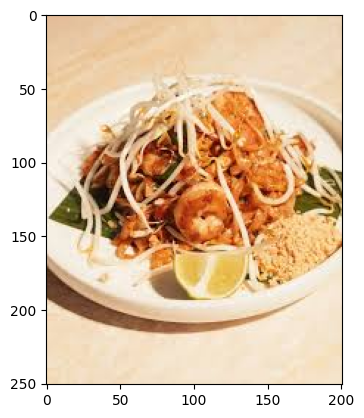

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
The prediction is:  pad_thai 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.660080e-09       8.058324e-07  1.075647e-07  3.958080e-08   6.029200e-07   

      cup_cakes  french_onion_soup        hummus  pad_thai  shrimp_and_grits  
0  8.307762e-10           0.000005  4.654296e-07  0.999993      2.688583e-07  


In [21]:
# Pad Thai

import matplotlib.pyplot as plt
img = 'new_test_images/pad_thai_1.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/pad_thai_2.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/pad_thai_3.jpeg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

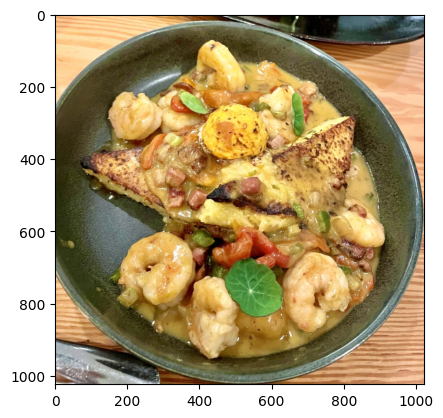

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
The prediction is:  shrimp_and_grits 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  2.972451e-09       7.241013e-07      0.000007  1.319196e-09   2.226335e-07   

      cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0  9.820901e-08       3.112343e-07  0.001588  0.000386          0.998018  


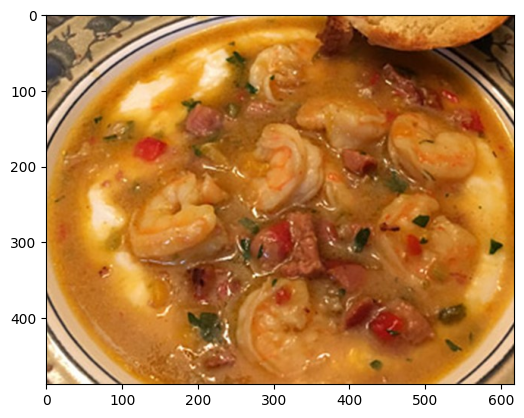

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
The prediction is:  shrimp_and_grits 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  1.210495e-10           0.000209      0.001988      0.000001   3.164945e-09   

      cup_cakes  french_onion_soup    hummus  pad_thai  shrimp_and_grits  
0  8.346765e-08           0.004151  0.000011  0.002696          0.990944  


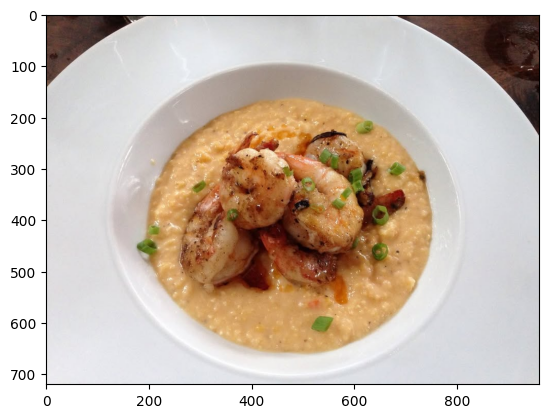

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
The prediction is:  shrimp_and_grits 

        beignets  breakfast_burrito  clam_chowder  creme_brulee  croque_madame  \
0  4.154394e-08       7.858910e-07      0.000279  2.121813e-07   3.133665e-08   

      cup_cakes  french_onion_soup    hummus      pad_thai  shrimp_and_grits  
0  3.881464e-10           0.000002  0.000011  1.202089e-07          0.999707  


In [22]:
# Shrimp and Grits

import matplotlib.pyplot as plt
img = 'new_test_images/shrimp_and_grits_1.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/shrimp_and_grits_2.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

import matplotlib.pyplot as plt
img = 'new_test_images/shrimp_and_grits_3.jpg'
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)